In [65]:
import os
import numpy as np
from PIL import Image, ImageStat
import matplotlib.pyplot as plt
import cv2
import csv

from skimage.feature import graycomatrix, graycoprops

In [50]:
def colour_balancing(img):
    img_resized = img.resize((256, 256))

    # Extract R, G, and B channels
    r, g, b = img_resized.split()

    # Calculate the mean values
    r_mean = ImageStat.Stat(r).mean[0]
    g_mean = ImageStat.Stat(g).mean[0]
    b_mean = ImageStat.Stat(b).mean[0]

    # Find the smallest mean value
    smallest_mean = min(r_mean, g_mean, b_mean)

    # Calculate scaling factors
    r_scaling_factor = smallest_mean / r_mean
    g_scaling_factor = smallest_mean / g_mean
    b_scaling_factor = smallest_mean / b_mean

    # Multiply each plane with the obtained scaling factors
    r_enhanced = r.point(lambda i: i * r_scaling_factor)
    g_enhanced = g.point(lambda i: i * g_scaling_factor)
    b_enhanced = b.point(lambda i: i * b_scaling_factor)

    # Recombine the planes to form the enhanced image
    img_enhanced = Image.merge("RGB", (r_enhanced, g_enhanced, b_enhanced))
    return img_enhanced

In [52]:
def image_segmentation(img):
    #RGB model is converted to the YCbCr model
    image_ycbcr = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2YCrCb)

    # Define thresholds for diseased part detection in YCbCr color space
    lower_threshold = np.array([0, 135, 85], dtype=np.uint8)  # Lower threshold for brown-black color
    upper_threshold = np.array([255, 180, 135], dtype=np.uint8)  # Upper threshold for brown-black color

    # Create a mask using the thresholds
    mask = cv2.inRange(image_ycbcr, lower_threshold, upper_threshold)
    segmented_image = cv2.bitwise_and(np.array(img), np.array(img), mask=mask)
    return segmented_image

In [60]:
def feature_extraction(label, img, angles = ['0', '45', '90','135'], properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity']):
    # Convert the segmented image to grayscale
    gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    glcm = graycomatrix(gray_image, distances=[1], angles=angles, levels=256, symmetric=True, normed=True)
    # Extract GLCM properties
    features = []
    glcm_props = [propery for name in properties for propery in graycoprops(glcm, name)[0]]
    for item in glcm_props:
        features.append(item)
    features.append(label) 
    return features

In [63]:
def save_features(csv_file_path, angles, properties, features):
    columns = []
    for name in properties:
        for ang in angles:
            columns.append(name + "_" + ang)
    columns.append("label")
    #print(columns)
    
    # Check file existence and create if needed
    if not os.path.exists(csv_file_path):
        with open(csv_file_path, 'w', newline='') as csvfile:
            csv_writer = csv.writer(csvfile)
            csv_writer.writerow(columns)

    # Write data for each image (append mode)
    with open(csv_file_path, 'a', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(features)

    print(columns)
    print(features)

In [72]:
def process_images(data_dir, csv_file_path, angles = ['0', '45', '90','135'], properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity'], printImages = True):
    count = 0
    # Delete file if it exist
    if os.path.exists(csv_file_path):
        os.remove(csv_file_path)
        print(f"CSV file '{csv_file_path}' deleted successfully.")
    else:
        print(f"CSV file '{csv_file_path}' not found.")

    for class_dir in os.listdir(data_dir):
        class_label = class_dir 
        for img_file in os.listdir(os.path.join(data_dir, class_dir)):
            count += 1 
            img_path = os.path.join(data_dir, class_dir, img_file)
            img = Image.open(img_path)
            
            img_enhanced = colour_balancing(img)
            segmented_image = image_segmentation(img_enhanced)
            features = feature_extraction(class_label, segmented_image, angles, properties)

            print(count, class_label, img_file, "-------------------------------------------------------------")
            save_features(csv_file_path, angles, properties, features)

            if printImages:
                fig, axes = plt.subplots(1, 3, figsize=(8, 8))
                axes[0].axis('off')
                axes[0].imshow(img)
                axes[1].axis('off')
                axes[1].imshow(img_enhanced)
                axes[2].axis('off')
                axes[2].imshow(segmented_image)
                plt.show()

In [73]:

data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-40"
csv_file_path = "D:/pythonProject/Image-research/vision/colorBased-40_data.csv"

angles = ['0', '45', '90','135']
properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity']

process_images(data_dir, csv_file_path, angles = angles, properties = properties, printImages=False)

CSV file 'D:/pythonProject/Image-research/vision/colorBased-40_data.csv' deleted successfully.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[125.24558823529844, 160.09910034603197, 126.26265318627838, 125.24558823529844, 0.8717605139282967, 0.8366803137902876, 0.870719136835074, 0.8717605139282967, 0.940595372955219, 0.9390092868049172, 0.9404421920228251, 0.940595372955219, 0.9457905453622999, 0.9427672598211649, 0.9446669072548929, 0.9457905453622999, 0.8847196556247675, 0.88173844070587

In [ ]:

data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-50"
csv_file_path = "D:/pythonProject/Image-research/vision/colorBased-50_data.csv"

angles = ['0', '45', '90','135']
properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity']

process_images(data_dir, csv_file_path, angles = angles, properties = properties, printImages=False)

In [ ]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/trainb-50"
csv_file_path = "D:/pythonProject/Image-research/vision/colorBased-b-50_data.csv"

angles = ['0', '45', '90','135']
properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity']

process_images(data_dir, csv_file_path, angles = angles, properties = properties, printImages=True)

CSV file 'D:/pythonProject/Image-research/vision/colorBased-mixed_data.csv' not found.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[125.24558823529844, 160.09910034603197, 126.26265318627838, 125.24558823529844, 0.8717605139282967, 0.8366803137902876, 0.870719136835074, 0.8717605139282967, 0.940595372955219, 0.9390092868049172, 0.9404421920228251, 0.940595372955219, 0.9457905453622999, 0.9427672598211649, 0.9446669072548929, 0.9457905453622999, 0.8847196556247675, 0.8817384407058793, 0.88

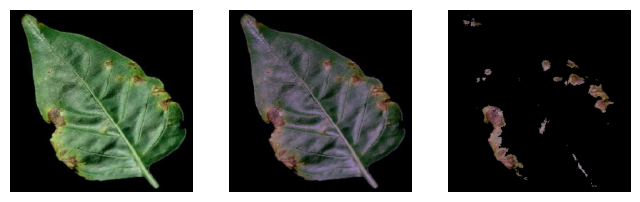

2 Pepper,_bell___Bacterial_spot 05af15b5-fbda-4dab-a4ba-c783d531d24d___JR_B.Spot 3150_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[36.788449754902935, 50.08793540945885, 46.58621323529527, 36.788449754902935, 0.8338017731628802, 0.7745752254346047, 0.789538670796252, 0.8338017731628802, 0.9594830913385274, 0.957555852681444, 0.9585793920911183, 0.9594830913385274, 0.965856570061337, 0.9618102359965766, 0.9636883777123326, 0.965856570061337, 0.9206078025645369, 0.9169132110044874, 0.918874450941778, 0.9206078025645369, 0.6893688725490404, 0.9270280661284385, 0.8374387254902

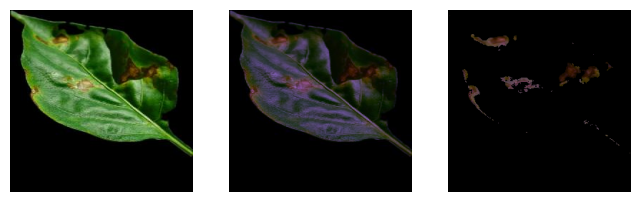

3 Pepper,_bell___Bacterial_spot 0c4e75b2-e4aa-437e-815c-636271d66bec___JR_B.Spot 3244_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[76.2484987745116, 113.37863898500986, 90.02040441176764, 76.2484987745116, 0.8401180202471309, 0.7631395359531002, 0.8112403429991384, 0.8401180202471309, 0.9344995089827869, 0.9306295343206561, 0.932983205042157, 0.9344995089827869, 0.9427099300425551, 0.9355561791064763, 0.9391138490222707, 0.9427099300425551, 0.8732893322890698, 0.8660713301498812, 0.8704576608907357, 0.8732893322890698, 1.354656862745131, 1.969642445213467, 1.61957720588241

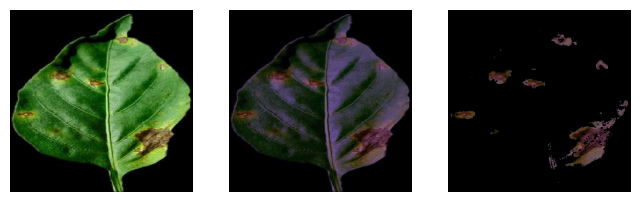

4 Pepper,_bell___Bacterial_spot 0fcbdf76-fcc4-4271-986a-9466a784d404___JR_B.Spot 3374_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[51.830759803923165, 80.60788927335818, 67.5616421568648, 51.830759803923165, 0.8544736958867203, 0.7745121464595128, 0.8103057697763413, 0.8544736958867203, 0.937195566064134, 0.9333822028857758, 0.9354341839968888, 0.937195566064134, 0.9450721645954246, 0.938286091437513, 0.9416231306056075, 0.9450721645954246, 0.8783355290502727, 0.8712023366639036, 0.8750371125899252, 0.8783355290502727, 1.1007046568627792, 1.6414302191465358, 1.393658088235

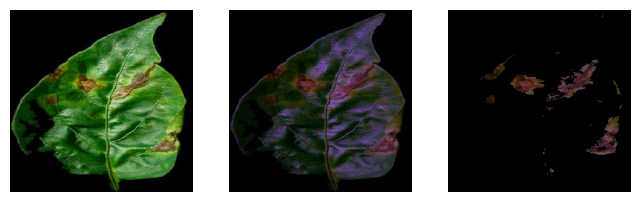

5 Pepper,_bell___Bacterial_spot 17000d8e-8095-4f00-b704-b94b1c531d8d___JR_B.Spot 3384_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[28.996323529412287, 33.91689350249913, 35.54852941176548, 28.996323529412287, 0.7925599768147277, 0.7582768800316577, 0.7456854225709324, 0.7925599768147277, 0.9598516815606261, 0.9584950393451739, 0.9583049643752, 0.9598516815606261, 0.9655650456532692, 0.9626485312480724, 0.9620530593190216, 0.9655650456532692, 0.9213152505947615, 0.9187127404493065, 0.9183484047461533, 0.9213152505947615, 0.7268075980392332, 0.8521953094963609, 0.89341299019

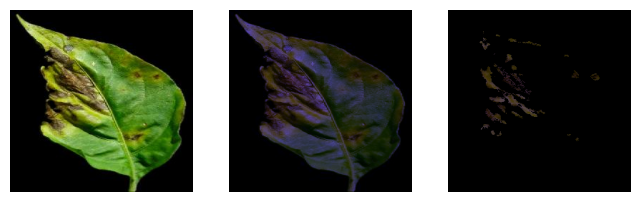

6 Pepper,_bell___Bacterial_spot 1d2949cc-b0fa-4a29-8540-2983230c34e9___JR_B.Spot 9017_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[196.4577205882447, 296.5126336024711, 256.87288602942687, 196.4577205882447, 0.8549741968268619, 0.7818597322556886, 0.8103755021779033, 0.8549741968268619, 0.864849048906987, 0.8582618819904737, 0.8611583629146549, 0.864849048906987, 0.8782622591469863, 0.8669867930543053, 0.8707260949974345, 0.8782622591469863, 0.7479638773953199, 0.7366134580778297, 0.7415937260178483, 0.7479638773953199, 3.0549019607843904, 4.4463821607075795, 3.92319240196

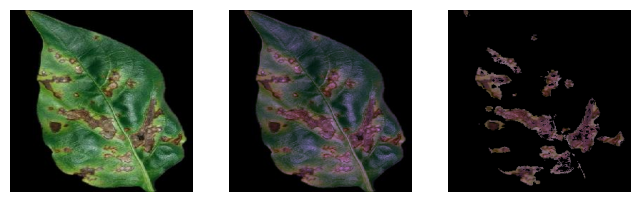

7 Pepper,_bell___Bacterial_spot 1e6d8dc0-a694-47e0-af80-81ccabdfd591___JR_B.Spot 3308_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[198.33121936275097, 285.05854671281617, 246.14494485294944, 198.33121936275097, 0.8014723203160944, 0.7156982169687115, 0.7536112321368749, 0.8014723203160944, 0.922644287641395, 0.9178215562697769, 0.9202094201838406, 0.922644287641395, 0.9290064937218717, 0.9217669810545832, 0.9249105968297525, 0.9290064937218717, 0.8512724815172971, 0.8423964091534752, 0.84678537699508, 0.8512724815172971, 2.4976715686275086, 3.541284121491902, 3.13272058823

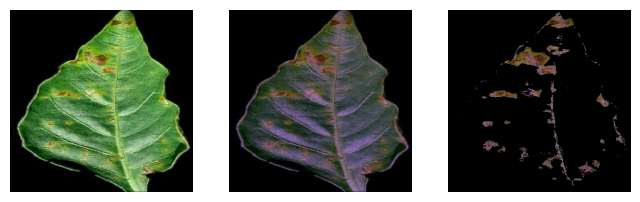

8 Pepper,_bell___Bacterial_spot 1f3b1b11-4934-4c0b-b054-8f8a977b488c___JR_B.Spot 3373_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[39.96167279411863, 64.7290734332971, 51.391390931373884, 39.96167279411863, 0.8476337106287859, 0.7541303543258383, 0.8040543602321041, 0.8476337106287859, 0.9584414486220922, 0.9556952631941267, 0.9573692320315002, 0.9584414486220922, 0.9639231104737909, 0.9589364284128555, 0.9613647558995081, 0.9639231104737909, 0.9186100104368147, 0.9133534360916911, 0.9165558464405843, 0.9186100104368147, 0.7608455882353181, 1.1832987312572478, 0.9578737745

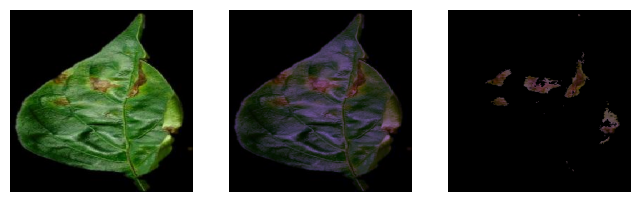

9 Pepper,_bell___Bacterial_spot 1f838b54-c372-4b51-b398-6988377b2218___JR_B.Spot 8977_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[173.2742034313773, 265.29491733949936, 207.16881127451498, 173.2742034313773, 0.8166754692435894, 0.7203567306711678, 0.7808148912985453, 0.8166754692435894, 0.9397537550906585, 0.9350133147074722, 0.9380998506223419, 0.9397537550906585, 0.9441083796709964, 0.9378255234529662, 0.941650528202801, 0.9441083796709964, 0.8831371202069934, 0.8742498986802545, 0.8800313297376602, 0.8831371202069934, 2.1105698529412247, 3.089119569396563, 2.4965073529

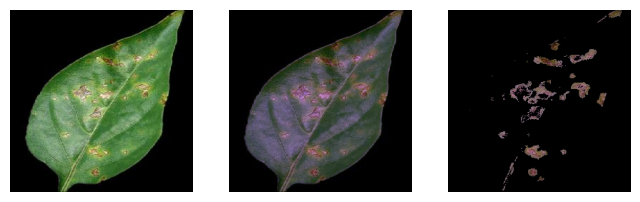

10 Pepper,_bell___Bacterial_spot 21f7119e-d926-4be3-9ace-d6b26b280e64___JR_B.Spot 8837_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[239.59356617647984, 414.32322952714594, 345.09886642158807, 239.59356617647984, 0.8852298447426158, 0.8022510518474043, 0.8346906759208252, 0.8852298447426158, 0.9217232408237646, 0.9165576944209479, 0.9190889619069048, 0.9217232408237646, 0.9271435681896509, 0.9195095977010445, 0.922411612003177, 0.9271435681896509, 0.8495737326746635, 0.8400780072022438, 0.844724519899112, 0.8495737326746635, 2.5907781862745796, 4.137670126874669, 3.56488970

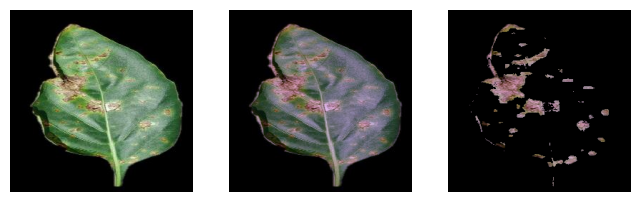

11 Pepper,_bell___Bacterial_spot 28c448aa-4d2c-4a96-baf0-e7ed99ae2495___JR_B.Spot 3385_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[15.750245098039278, 19.502775855440394, 16.003339460784414, 15.750245098039278, 0.7711873120846845, 0.7177501439167902, 0.7675104676244588, 0.7711873120846845, 0.9659940115477302, 0.9641848717804918, 0.9657336295101236, 0.9659940115477302, 0.9711219299122817, 0.9679697939504747, 0.9705117451819449, 0.9711219299122817, 0.9331444303460763, 0.9296524669703634, 0.9326414431667969, 0.9331444303460763, 0.483976715686283, 0.611672433679366, 0.5079350

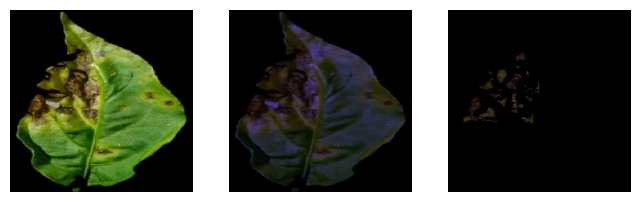

12 Pepper,_bell___Bacterial_spot 2cdea224-6f10-4a3d-a3f1-1debd1a42640___JR_B.Spot 8926_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[198.00238970588717, 238.34611303346384, 218.09203431373044, 198.00238970588717, 0.7944897072018705, 0.7535363279244095, 0.7736382985309915, 0.7944897072018705, 0.9437054716048083, 0.9416245411024787, 0.942802021600211, 0.9437054716048083, 0.9471805695868515, 0.9441423777945902, 0.9458033126156302, 0.9471805695868515, 0.8905800171368538, 0.8866567764064536, 0.8888756519334448, 0.8905800171368538, 2.2103860294118136, 2.6690042291428075, 2.434283

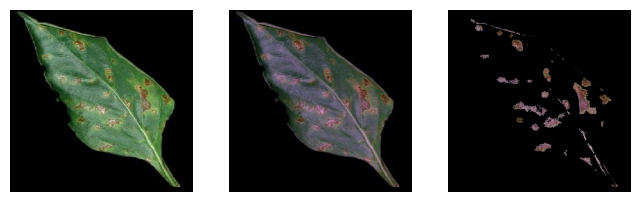

13 Pepper,_bell___Bacterial_spot 32bc632f-7dfc-4a3a-b25a-f71fba5b02b1___JR_B.Spot 8967_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[107.81314338235663, 163.34803537102056, 148.24898897059379, 107.81314338235663, 0.8818503253994223, 0.8216491749291291, 0.8375377133322118, 0.8818503253994223, 0.9355098464125754, 0.9324584915300426, 0.9335033911118648, 0.9355098464125754, 0.9404624361904438, 0.936066387191279, 0.9375085662958812, 0.9404624361904438, 0.8751786727348804, 0.8694788384264825, 0.8714285812173512, 0.8751786727348804, 1.6078737745098624, 2.2934256055364677, 2.121660

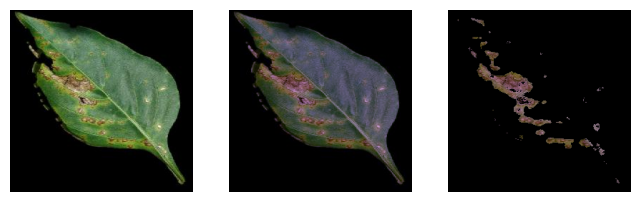

14 Pepper,_bell___Bacterial_spot 356984ef-4342-4233-a2e6-3db044cbd4b2___JR_B.Spot 3147_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[67.59819240196218, 119.63986159170017, 94.85137867647349, 67.59819240196218, 0.8816163380272406, 0.7912599717981929, 0.8338882571871837, 0.8816163380272406, 0.9504912130527831, 0.9471447373600614, 0.9487143312832921, 0.9504912130527831, 0.9593102261176208, 0.9514842420635299, 0.9541111580363176, 0.9593102261176208, 0.9034335460905509, 0.8970831535088598, 0.900058882382304, 0.9034335460905509, 0.8967218137255238, 1.5844982698962664, 1.279840686

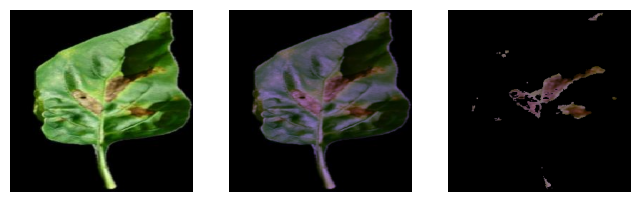

15 Pepper,_bell___Bacterial_spot 35ef7246-60e5-4bcc-bc1f-020eac1eacc2___JR_B.Spot 3298_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[61.9149203431384, 67.09345636293979, 68.07720588235387, 61.9149203431384, 0.7434216576595267, 0.723017067289828, 0.7178848565150212, 0.7434216576595267, 0.9641401299716391, 0.963507539175785, 0.9635428819274631, 0.9641401299716391, 0.9665774585692014, 0.965841230958306, 0.9657960199091664, 0.9665774585692014, 0.9295661902217293, 0.928346778048577, 0.9284148853130811, 0.9295661902217293, 1.0653492647059017, 1.1627835447905088, 1.160079656862767

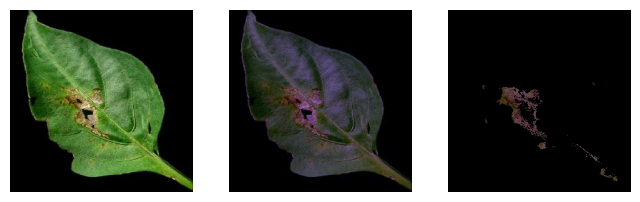

16 Pepper,_bell___Bacterial_spot 3a03526d-0bf4-4898-9f0f-8a9c31afd3eb___JR_B.Spot 3380_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[10.985723039215742, 13.76759707804701, 11.4848651960785, 10.985723039215742, 0.748019402852034, 0.6854220341888145, 0.7365705306841269, 0.748019402852034, 0.9747253575086707, 0.9733963388683439, 0.9746028531097226, 0.9747253575086707, 0.9785094024481551, 0.9763586713841531, 0.977740736976084, 0.9785094024481551, 0.9500895225704059, 0.9475004325222957, 0.9498507212896115, 0.9500895225704059, 0.36844362745098674, 0.4529642445213442, 0.3881433823

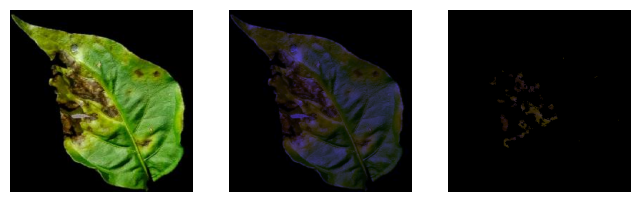

17 Pepper,_bell___Bacterial_spot 42ef264d-f255-4674-885a-0921a0e7f649___JR_B.Spot 9022_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[100.42104779412018, 156.67786236063654, 126.89126838235836, 100.42104779412018, 0.8634602180517994, 0.7877393397429224, 0.8274693752292035, 0.8634602180517994, 0.9164395732919917, 0.9117301399847846, 0.9145863960146151, 0.9164395732919917, 0.9257500272065797, 0.9179333322119466, 0.9220716564810911, 0.9257500272065797, 0.8398614914956078, 0.8312518481566749, 0.8364682757750024, 0.8398614914956078, 1.7504595588235916, 2.582206843521824, 2.142647

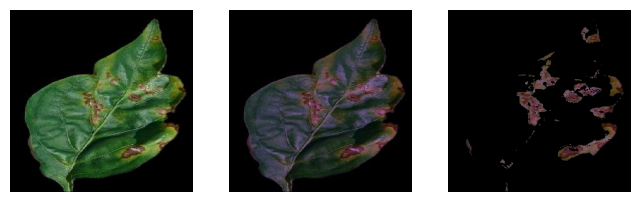

18 Pepper,_bell___Bacterial_spot 4aa16bda-c8f4-40b1-9f68-16bc936e6e9e___JR_B.Spot 3157_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[38.96106004902084, 68.59389465590348, 47.17981004902104, 38.96106004902084, 0.8686431353151711, 0.76960492416196, 0.8409336933680026, 0.8686431353151711, 0.9536773655646831, 0.950420269318683, 0.9526050332750533, 0.9536773655646831, 0.9605662146507473, 0.9546925278416258, 0.9577395146321915, 0.9605662146507473, 0.9095005175903942, 0.9032986883317978, 0.9074563494209653, 0.9095005175903942, 0.7233455882353197, 1.2169780853518235, 0.908210784313

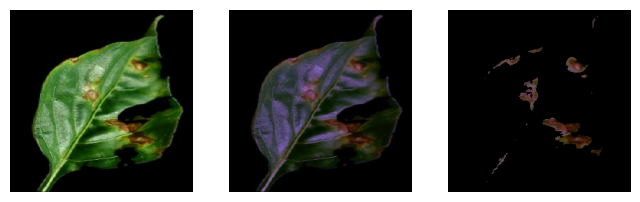

19 Pepper,_bell___Bacterial_spot 4b70a1bf-7bee-41d1-b4ff-415307d6d1ca___NREC_B.Spot 1808_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[193.70833333334343, 280.0381545559633, 237.05831801471896, 193.70833333334343, 0.8473275364115772, 0.7799840443351321, 0.8130838358381757, 0.8473275364115772, 0.899833786591403, 0.8954586685752126, 0.8985472103261748, 0.899833786591403, 0.9082663912092513, 0.9006954486921966, 0.9045948770969484, 0.9082663912092513, 0.8097008434914227, 0.8018462271264925, 0.807387089184951, 0.8097008434914227, 2.634742647058905, 3.677462514417822, 3.204304534

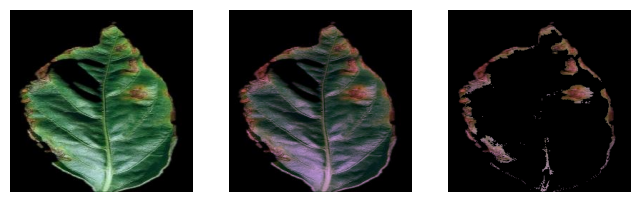

20 Pepper,_bell___Bacterial_spot 4c664b0a-9ee7-48c2-aaf4-d54e34f5edd3___JR_B.Spot 9060_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[80.46102941176532, 108.54188389081439, 86.43042279411851, 80.46102941176532, 0.9269867439182612, 0.9018531542016186, 0.9215698998775532, 0.9269867439182612, 0.9025861348226201, 0.8998792212705257, 0.9019728731482082, 0.9025861348226201, 0.9279859293799869, 0.9184419760539736, 0.9264203836189501, 0.9279859293799869, 0.8146617307740368, 0.8097826128744477, 0.8135550638952337, 0.8146617307740368, 1.3047487745098343, 1.7370242214533425, 1.38805147

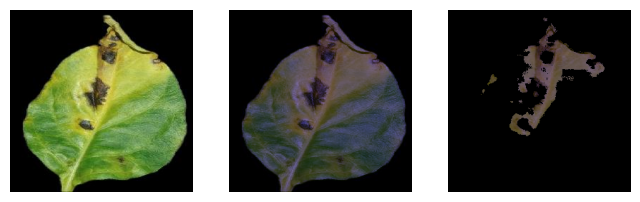

21 Pepper,_bell___Bacterial_spot 4eac0e27-27a7-49ad-80d7-6475aa904154___NREC_B.Spot 1896_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[109.65873161765197, 164.97531718570553, 139.13890931373453, 109.65873161765197, 0.8717602839812372, 0.807752154883333, 0.837284875045182, 0.8717602839812372, 0.8926353167523758, 0.8871714899977735, 0.8898631826148562, 0.8926353167523758, 0.9036375399126844, 0.8946749655097561, 0.8983002755929128, 0.9036375399126844, 0.7967978087136144, 0.7870732526648696, 0.791856483773441, 0.7967978087136144, 2.0932291666667475, 2.98857362552878, 2.59595588

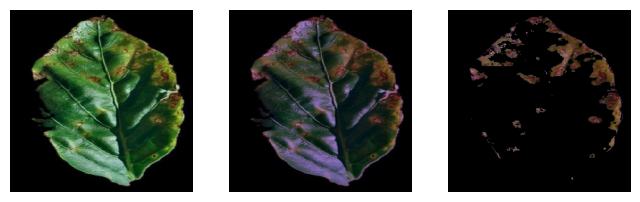

22 Pepper,_bell___Bacterial_spot 505ac655-cca9-479c-8a2f-35a01b9030cf___JR_B.Spot 8836_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[120.38808210784791, 160.69114955787245, 136.43321078431947, 120.38808210784791, 0.864068086754106, 0.8192279968825692, 0.8459513014288293, 0.864068086754106, 0.9330591156283736, 0.9307056409174668, 0.9326149409461679, 0.9330591156283736, 0.9378106483122517, 0.9343361328386636, 0.9364994751207053, 0.9378106483122517, 0.8705993132572027, 0.8662129900355926, 0.8697706280760242, 0.8705993132572027, 1.8385110294118403, 2.3450057670128244, 2.0399509

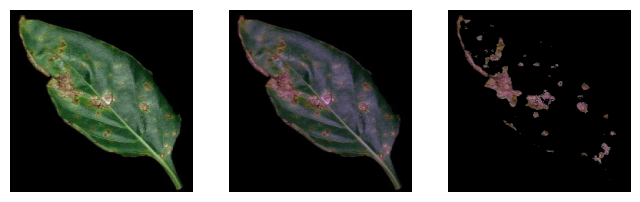

23 Pepper,_bell___Bacterial_spot 557f35cb-b34b-4dc5-959b-efad147d5e88___JR_B.Spot 3382_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[62.87386642156962, 91.55724721261248, 69.86047794117825, 62.87386642156962, 0.8906247060625763, 0.8412901361626561, 0.8784708060071876, 0.8906247060625763, 0.8931270927619382, 0.8891858030044992, 0.8924524889204427, 0.8931270927619382, 0.914566590683326, 0.9032572224135853, 0.9103022630614878, 0.914566590683326, 0.7976760038253918, 0.7906513922647561, 0.796471444980293, 0.7976760038253918, 1.3104779411764964, 1.912495194156147, 1.5032169117647

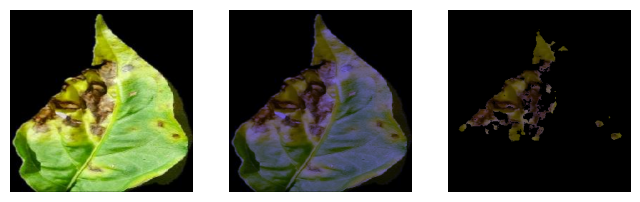

24 Pepper,_bell___Bacterial_spot 58fe22f7-f357-448a-b0aa-ebad44a91f3d___JR_B.Spot 8895_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[118.37254901961123, 179.75021914648482, 139.089736519613, 118.37254901961123, 0.8521858602246891, 0.7762694964375555, 0.8262534153441056, 0.8521858602246891, 0.9080308459304994, 0.9024125767019936, 0.9067902779142221, 0.9080308459304994, 0.9191757932671796, 0.909583208467613, 0.9157608275586079, 0.9191757932671796, 0.8245200171612583, 0.8143484585899315, 0.822268608119752, 0.8245200171612583, 2.021047794117709, 2.9158631295656385, 2.3225796568

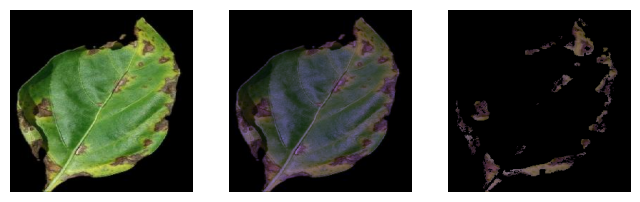

25 Pepper,_bell___Bacterial_spot 5b00e7ef-db0e-43d3-9d4c-db2d8ee2fac3___JR_B.Spot 3360_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[44.05459558823624, 62.1401922337585, 50.97889093137358, 44.05459558823624, 0.7840842718493365, 0.6966011609850179, 0.750147647282002, 0.7840842718493365, 0.9653195062856286, 0.9628926546701373, 0.9644311922179775, 0.9653195062856286, 0.9685330572141989, 0.9650163823163463, 0.967032476668147, 0.9685330572141989, 0.9318417492155296, 0.9271622644177042, 0.9301275245229893, 0.9318417492155296, 0.8280024509804121, 1.147620146097696, 0.9637867647059

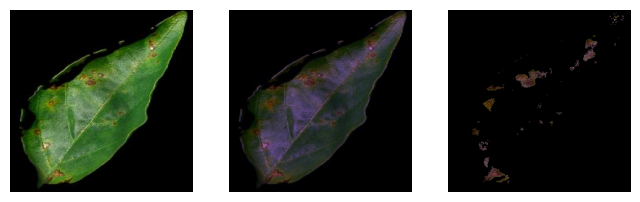

26 Pepper,_bell___Bacterial_spot 6e1e07ba-212d-4494-b8bf-73d12d720c20___JR_B.Spot 3392_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[29.98489583333428, 31.518031526337406, 30.278063725491133, 29.98489583333428, 0.9001353061118808, 0.8954263947310441, 0.8991589104635253, 0.9001353061118808, 0.9642774261981456, 0.9638143954863975, 0.9641548992031453, 0.9642774261981456, 0.9676359539722189, 0.9668428509122334, 0.9674664127436593, 0.9676359539722189, 0.9298309546753201, 0.9289381889468097, 0.9295946696574274, 0.9298309546753201, 0.6541973039215869, 0.6973625528643126, 0.6537071

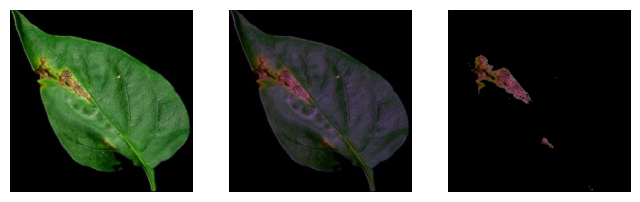

27 Pepper,_bell___Bacterial_spot 75faa1f4-e20f-4bb2-811f-9cbd757c652c___JR_B.Spot 9006_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[183.33504901961237, 268.16636678202144, 210.15667892157455, 183.33504901961237, 0.80006638693869, 0.7085995575382948, 0.7708022586441744, 0.80006638693869, 0.9187540633504663, 0.9129483084304876, 0.9167941384663795, 0.9187540633504663, 0.9264749411932748, 0.9175421735616159, 0.9221730597318726, 0.9264749411932748, 0.8441090289229926, 0.8334746138660887, 0.8405114923263111, 0.8441090289229926, 2.531832107843161, 3.60855055747809, 2.953645833333

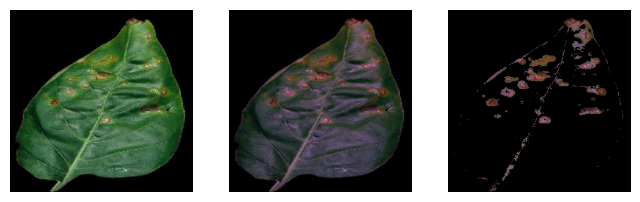

28 Pepper,_bell___Bacterial_spot 81d96896-2e99-4eaf-b86e-c2d8c6a3eabb___NREC_B.Spot 1818_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[189.27052696079306, 310.9636755094437, 253.4451746323629, 189.27052696079306, 0.8284856338883441, 0.71922091038308, 0.7703232325679115, 0.8284856338883441, 0.9145552519163994, 0.9083629546864802, 0.9122276062442464, 0.9145552519163994, 0.9216465157749626, 0.9128196065133688, 0.9178848505111606, 0.9216465157749626, 0.8364113088078688, 0.8251232574467525, 0.8321592055941078, 0.8364113088078688, 2.543719362745124, 3.8581622452905284, 3.22633272

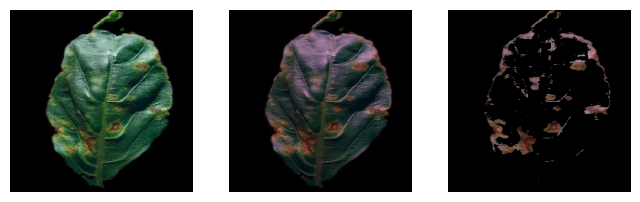

29 Pepper,_bell___Bacterial_spot 875f41e8-cd70-44f4-a17c-c8b77fed406c___JR_B.Spot 8902_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[160.63866421569352, 203.98197616302858, 180.82840073530141, 160.63866421569352, 0.8361387418620975, 0.7926847141093154, 0.8155439763134192, 0.8361387418620975, 0.923730530383437, 0.9211560322767834, 0.9229801094823198, 0.923730530383437, 0.9300531815518917, 0.925522785424986, 0.927992714847743, 0.9300531815518917, 0.8532780927624658, 0.8485284357999064, 0.8518922824999949, 0.8532780927624658, 2.183394607843203, 2.7787158785084505, 2.4800551470

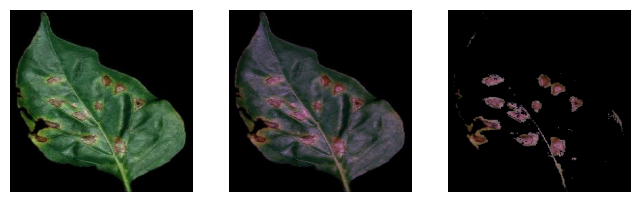

30 Pepper,_bell___Bacterial_spot 8e049c5d-6a3b-4972-94e3-057e6cbe3892___NREC_B.Spot 1901_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[189.34898897059617, 274.9892964244744, 243.75611213236502, 189.34898897059617, 0.8514714871515457, 0.7850038595939585, 0.8087368726504626, 0.8514714871515457, 0.9053182712893585, 0.9006420875882142, 0.903327444920641, 0.9053182712893585, 0.9142064778179881, 0.9058035320118543, 0.9093177522487838, 0.9142064778179881, 0.8196011723303525, 0.8111561699352565, 0.8160004727468537, 0.8196011723303525, 2.568412990196136, 3.6381853133412823, 3.235799

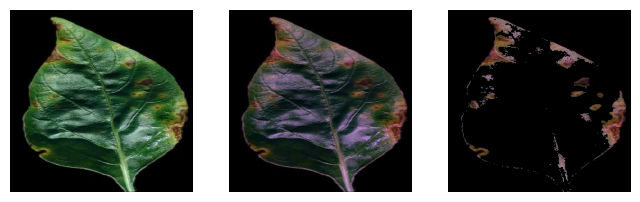

31 Pepper,_bell___healthy 01fbd010-0cc1-4c48-98bc-49e328bf9bbc___JR_HL 8584_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[99.2158700980393, 124.64661284121577, 95.49497549019631, 99.2158700980393, 0.4364444529002464, 0.2935303086567538, 0.45664806271870717, 0.4364444529002464, 0.9887412766058173, 0.987789977771949, 0.9888485278302356, 0.9887412766058173, 0.9892235845432942, 0.988085842688544, 0.9892678383060136, 0.9892235845432942, 0.9776093120641014, 0.9757290401867075, 0.9778214109920241, 0.9776093120641014, 0.9137867647058846, 1.1264898116109259, 0.8891544117647077, 0.91

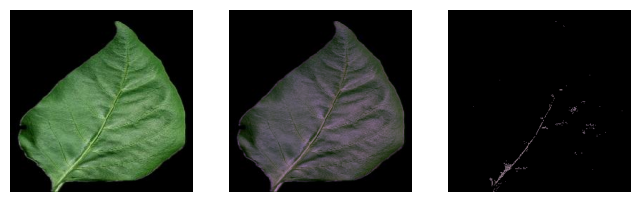

32 Pepper,_bell___healthy 0a3f2927-4410-46a3-bfda-5f4769a5aaf8___JR_HL 8275_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[127.3591299019616, 136.56106113033673, 105.46839767156935, 127.3591299019616, 0.3058227639267555, 0.25763138099931865, 0.42444331543968244, 0.3058227639267555, 0.9728430081057698, 0.9720911517607332, 0.9744203597869131, 0.9728430081057698, 0.9735093723374278, 0.9726132713031307, 0.9753572658993896, 0.9735093723374278, 0.9464235184202829, 0.9449612073315089, 0.9494950375672572, 0.9464235184202829, 1.6882965686274516, 1.7998462129950286, 1.440272671568626,

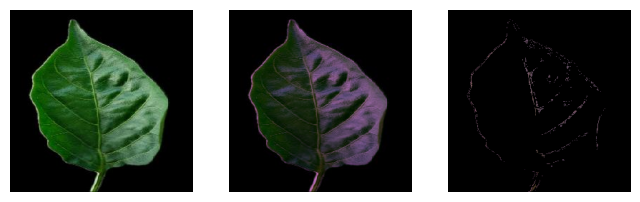

33 Pepper,_bell___healthy 0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL 8026_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[342.68180147059496, 407.301038062296, 345.051470588243, 342.68180147059496, 0.6208782943391593, 0.551070635621111, 0.6182566406829726, 0.6208782943391593, 0.9398517689438175, 0.9368819172840608, 0.9398370760878074, 0.9398517689438175, 0.9443104108162687, 0.9401729040196066, 0.9437182527114638, 0.9443104108162687, 0.883321347586823, 0.8777477269338577, 0.8832937295892791, 0.883321347586823, 3.5359681372548906, 4.13345636293742, 3.53970588235293, 3.5359681

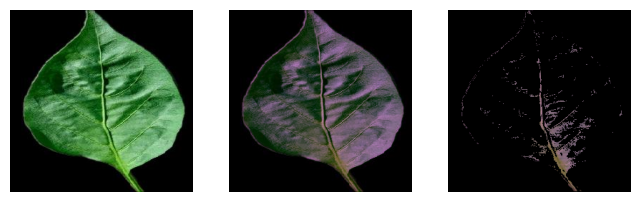

34 Pepper,_bell___healthy 0b76f650-27cf-4b62-b3ad-c97d81e0db0c___JR_HL 8554_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[228.73569240196164, 278.5716262975813, 155.98872549019737, 228.73569240196164, 0.475102811448992, 0.36320825680843855, 0.6420408087795363, 0.475102811448992, 0.9811129672628712, 0.9799626148448074, 0.9828284863803342, 0.9811129672628712, 0.981589681656004, 0.9802576596840665, 0.9835941319535527, 0.981589681656004, 0.9625826545313558, 0.9603267264934724, 0.9659518336406587, 0.9625826545313558, 1.8134497549019646, 2.1365321030373234, 1.3109681372549014, 1.

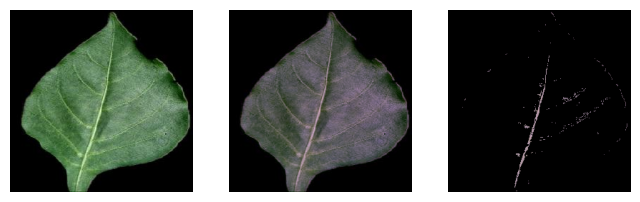

35 Pepper,_bell___healthy 0ba474dd-0cfd-4fd2-a58c-8e3d18dbe7c3___JR_HL 8395_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[96.17365196078465, 108.59371011149712, 89.6246323529414, 96.17365196078465, 0.44828255149521395, 0.3789017352081261, 0.4854096248004503, 0.44828255149521395, 0.9802561311789076, 0.9792103498097344, 0.9807001593774609, 0.9802561311789076, 0.9811701834616843, 0.979863357726189, 0.9820601301883743, 0.9811701834616843, 0.9609020827138398, 0.9588529091745024, 0.9617728026029773, 0.9609020827138398, 1.1913602941176489, 1.3474202229911734, 1.111397058823532, 1.

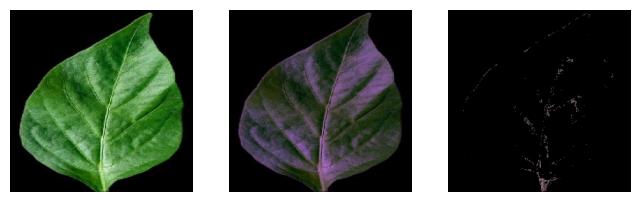

36 Pepper,_bell___healthy 0bb97c36-159d-4ee2-8b06-1fbf3f533af5___JR_HL 8345_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[460.0675551470653, 539.3774702037834, 400.67971813726234, 460.0675551470653, 0.4344639639264778, 0.33948993079263057, 0.50746620361445, 0.4344639639264778, 0.9566836879011406, 0.954177730799535, 0.9584143638797253, 0.9566836879011406, 0.958042305371038, 0.9552786958950937, 0.9599465897765876, 0.958042305371038, 0.915243678696127, 0.91045514195375, 0.9185580928909787, 0.915243678696127, 3.8292892156862566, 4.424636678200806, 3.3996936274509513, 3.82928921

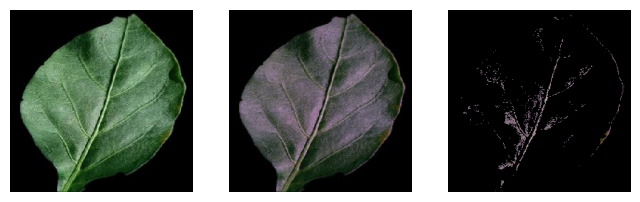

37 Pepper,_bell___healthy 0c93ef1a-ccc8-4a62-9353-308e7da3ac3e___JR_HL 8245_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[291.08005514706406, 370.95680123031286, 256.5807598039261, 291.08005514706406, 0.6832638823596493, 0.5977399478584754, 0.7207367075518168, 0.6832638823596493, 0.9280398600568853, 0.9235320521842074, 0.9291274022573626, 0.9280398600568853, 0.9346767015846335, 0.9276395198257277, 0.9354325489628633, 0.9346767015846335, 0.8612579818544034, 0.8529114514115737, 0.8632777296255149, 0.8612579818544034, 3.3939031862744815, 4.2328335255672584, 3.08486519607839, 3

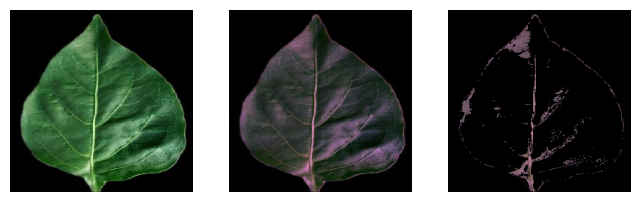

38 Pepper,_bell___healthy 0d4e35c0-f6d6-4810-9522-14e1d491a05d___JR_HL 8673_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[39.18541666666694, 45.4329565551715, 32.908823529412, 39.18541666666694, 0.5603082042754208, 0.49131065793992507, 0.6301027356638543, 0.5603082042754208, 0.989154764471229, 0.9886509871237, 0.9896908566091117, 0.989154764471229, 0.9898777249557464, 0.9892121517206697, 0.9904783570428786, 0.9898777249557464, 0.9784271480761324, 0.9774307743406664, 0.9794879916556772, 0.9784271480761324, 0.5210477941176505, 0.6015840061514883, 0.44702818627451313, 0.521047

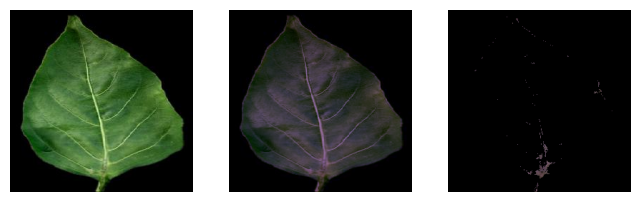

39 Pepper,_bell___healthy 0dd09705-5593-4d01-9a9b-c1d5857daf92___JR_HL 8212_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[500.5931985294218, 571.4701114955934, 426.89203431373414, 500.5931985294218, 0.443288659312353, 0.3668034777921889, 0.5252125802009442, 0.443288659312353, 0.9424568864356814, 0.9394504012670656, 0.9452898129671236, 0.9424568864356814, 0.9445973439829949, 0.9407556138426765, 0.9480385560199431, 0.9445973439829949, 0.8882249827900388, 0.8825670564408505, 0.8935728304994194, 0.8882249827900388, 4.63155637254898, 5.254809688581447, 3.9938419117646755, 4.6315

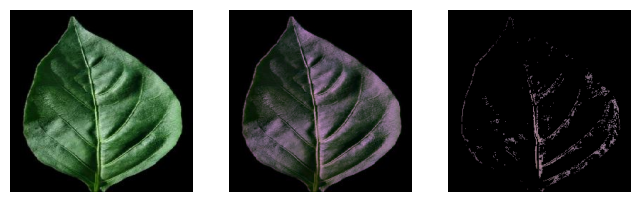

40 Pepper,_bell___healthy 0e043e9a-7652-4e7a-aef1-0caa0c085f55___JR_HL 8479_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[147.62509191176517, 196.66408304498432, 137.08691789215757, 147.62509191176517, 0.47387884335378677, 0.30181955677004185, 0.5114358482798128, 0.47387884335378677, 0.9843297671135939, 0.9827308628975832, 0.9848199050498803, 0.9843297671135939, 0.9849192097260017, 0.9829378680967908, 0.9853777723466871, 0.9849192097260017, 0.968905090425902, 0.9657599488914285, 0.9698702453824553, 0.968905090425902, 1.3164828431372546, 1.6992848904267785, 1.224080882352944

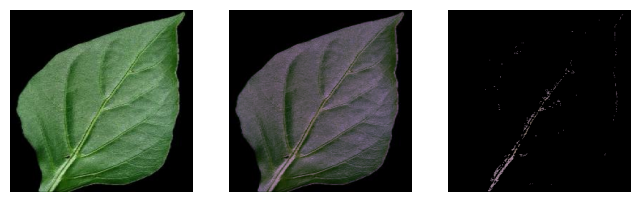

41 Pepper,_bell___healthy 0e526c7b-72ee-4547-916b-5cba013097b6___JR_HL 7735_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[160.30315563725551, 184.14083813918134, 131.9806678921582, 160.30315563725551, 0.5893374969536729, 0.5299904925777338, 0.6618242699635662, 0.5893374969536729, 0.9799027429037773, 0.9790705434471584, 0.9807758208891778, 0.9799027429037773, 0.9807917537029616, 0.9798978718874432, 0.9821443805507659, 0.9807917537029616, 0.9602093855503463, 0.9585791290459141, 0.9619212108408406, 0.9602093855503463, 1.4156862745098118, 1.6042752787389831, 1.1789522058823572,

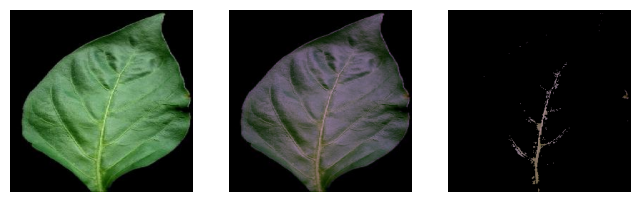

42 Pepper,_bell___healthy 0e5d9ac1-4de8-491e-ab95-809850866805___JR_HL 8534_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[13.064797794117656, 14.019992310649764, 12.13912377450981, 13.064797794117656, 0.29211455400333564, 0.2433229964712891, 0.3422700310756756, 0.29211455400333564, 0.9977328961734038, 0.9976624978554356, 0.9978094904824657, 0.9977328961734038, 0.997831458633045, 0.9977234610870307, 0.9979089303224786, 0.997831458633045, 0.995470932106568, 0.995330459627147, 0.9956237792968778, 0.995470932106568, 0.15713848039215714, 0.1685505574778934, 0.14592524509803953, 

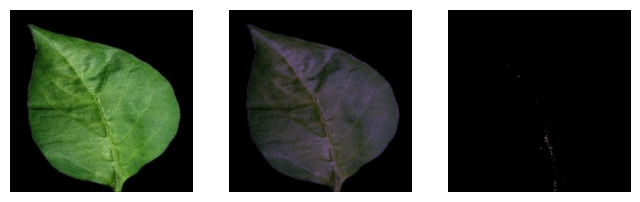

43 Pepper,_bell___healthy 0eabc3c2-d492-4227-90d8-14dab9fd4a9a___JR_HL 8699_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[46.542310049019726, 57.35467896962723, 50.82521446078445, 46.542310049019726, 0.37686609724519027, 0.23509291759416434, 0.3195242304917387, 0.37686609724519027, 0.9938114169501754, 0.9932950771818606, 0.9935357083256892, 0.9938114169501754, 0.9940390480784174, 0.9933776336766251, 0.9937783221011347, 0.9940390480784174, 0.9876611324605155, 0.9866351103537184, 0.9871132037182289, 0.9876611324605155, 0.4683210784313743, 0.5699038831218779, 0.514767156862746

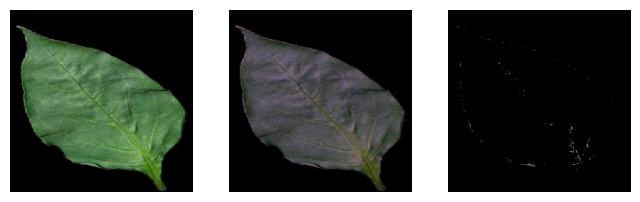

44 Pepper,_bell___healthy 0f56ffda-5d57-4a61-8f7f-37f22a02520a___JR_HL 8589_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[173.1740808823541, 203.18062283737353, 148.27095588235426, 173.1740808823541, 0.4914601017847172, 0.40525706947246165, 0.5643110405203151, 0.4914601017847172, 0.9765641302610469, 0.9752425309741061, 0.977528929178878, 0.9765641302610469, 0.9778316660272741, 0.9759814271023111, 0.9787604280875071, 0.9778316660272741, 0.953677500512515, 0.9510979942207803, 0.9555628073816038, 0.953677500512515, 1.6911458333333358, 1.9702268358324058, 1.4817095588235318, 1.

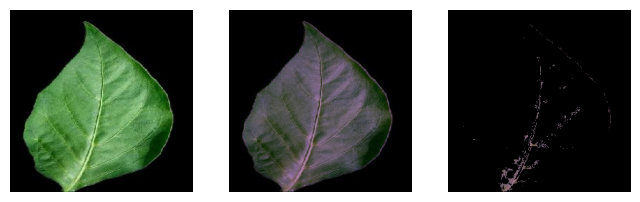

45 Pepper,_bell___healthy 1a1a389d-f186-4481-8a5c-b8c6f864ad7f___JR_HL 8649_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[182.54693627451195, 227.06860438293484, 151.51896446078632, 182.54693627451195, 0.7342400127449488, 0.6706761438632958, 0.7794119206501346, 0.7342400127449488, 0.9625481204421, 0.9605414884982687, 0.9636508550173983, 0.9625481204421, 0.9655837499217403, 0.9627048582353651, 0.9681556554941358, 0.9655837499217403, 0.9264988841666195, 0.9226399511264697, 0.9286229703757628, 0.9264988841666195, 1.872058823529426, 2.2845059592465145, 1.5487132352941242, 1.872

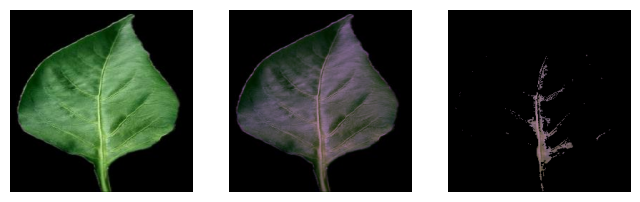

46 Pepper,_bell___healthy 1b574484-60cd-4ae4-83ed-511a5ae07ea8___JR_HL 7849_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[157.58412990196152, 152.3893886966585, 121.37264093137321, 157.58412990196152, 0.44130840741067395, 0.4618065144249084, 0.5696909701445931, 0.44130840741067395, 0.977498329356141, 0.9776407243104667, 0.9789533597646151, 0.977498329356141, 0.9780587290438579, 0.9781220468685736, 0.9800367994035383, 0.9780587290438579, 0.9555029838940468, 0.9557813858302938, 0.9583496805944279, 0.9555029838940468, 1.648529411764711, 1.6045213379469783, 1.315655637254899, 1

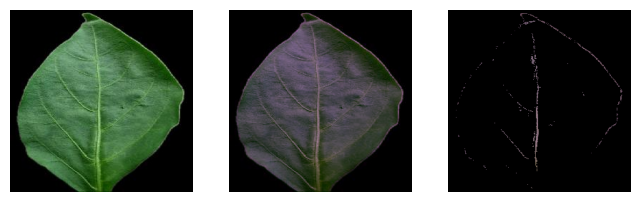

47 Pepper,_bell___healthy 1c665f14-938a-4563-8613-031a2cb04453___JR_HL 5815_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[104.60297181372589, 107.57770088427694, 85.6783088235296, 104.60297181372589, 0.5454980212400546, 0.5343849395323492, 0.6277260557525556, 0.5454980212400546, 0.988618530159137, 0.9883432567014133, 0.9890780453806977, 0.988618530159137, 0.9890619517715435, 0.9887527642261958, 0.9895595619388166, 0.9890619517715435, 0.9773665981740126, 0.9768223930671558, 0.9782753798541015, 0.9773665981740126, 0.90275735294118, 0.9397308727412655, 0.7671875000000038, 0.90

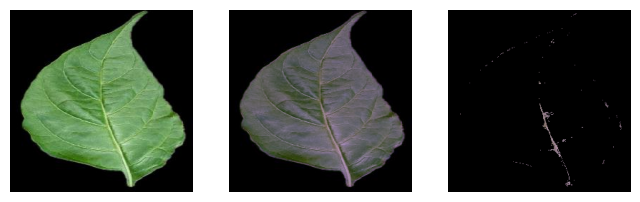

48 Pepper,_bell___healthy 1dd236c3-5ff0-4a03-996f-e832b50dff82___JR_HL 8787_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[4.058762254901963, 3.8924413687043447, 3.100183823529413, 4.058762254901963, -0.00020829151237672388, 0.044524650812961294, 0.23601596477802053, -0.00020829151237672388, 0.9995710835961163, 0.9995847797594084, 0.9996170382457926, 0.9995710835961163, 0.9995711307304442, 0.9995857270228616, 0.9996257898595018, 0.9995711307304442, 0.9991423511615143, 0.9991697319266649, 0.9992342231512905, 0.9991423511615143, 0.04111519607843139, 0.038969627066512864, 0.031

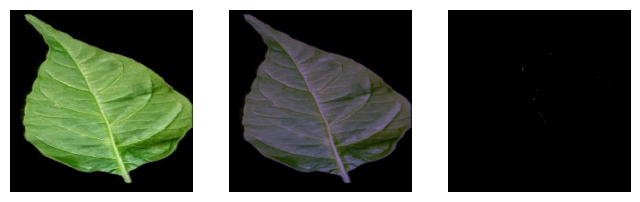

49 Pepper,_bell___healthy 1fdbead6-97f6-4712-8c5e-2a1285e1e777___JR_HL 8681_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[50.88704044117665, 68.52186082276096, 62.319454656862895, 50.88704044117665, 0.5628927233229434, 0.4136873115360828, 0.4646910711863987, 0.5628927233229434, 0.9836099963689967, 0.9819161991718327, 0.9826605865357377, 0.9836099963689967, 0.9857618645916632, 0.9827612458947813, 0.983875043205858, 0.9857618645916632, 0.9674886249570178, 0.9641594221960582, 0.96562182833076, 0.9674886249570178, 0.7256127450980421, 0.9671357170319194, 0.8768688725490236, 0.72

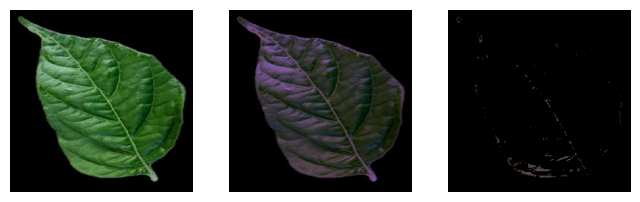

50 Pepper,_bell___healthy 2a5eb7c8-4c8b-43a6-9448-b3983beef06c___JR_HL 8248_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[44.30980392156869, 50.563537101115514, 31.05597426470618, 44.30980392156869, 0.4802478818304237, 0.40883964959255636, 0.6354989022419463, 0.4802478818304237, 0.9870717349335746, 0.9864060610984451, 0.9882816707487008, 0.9870717349335746, 0.9875197020594646, 0.9867088312350182, 0.9893947315710186, 0.9875197020594646, 0.9743106099047769, 0.9729969173717494, 0.9767006607378435, 0.9743106099047769, 0.6577205882352973, 0.7444213763937043, 0.47509191176471055,

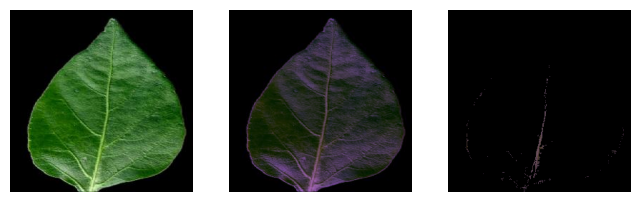

51 Tomato___Early_blight 004cbe60-8ff9-4965-92df-e86694d5e9ba___RS_Erly.B 8253_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[188.71924019608645, 279.44642829682823, 200.50444240196825, 188.71924019608645, 0.9119025196551592, 0.8700204871882955, 0.9064009787491403, 0.9119025196551592, 0.9175568786442242, 0.914035247650494, 0.9170819232157421, 0.9175568786442242, 0.926144253755998, 0.9191757741991863, 0.9239611912488083, 0.926144253755998, 0.8419106255473315, 0.8354604339475, 0.8410392538890843, 0.8419106255473315, 2.240349264705915, 3.165244136870666, 2.4291973039216, 2.2403

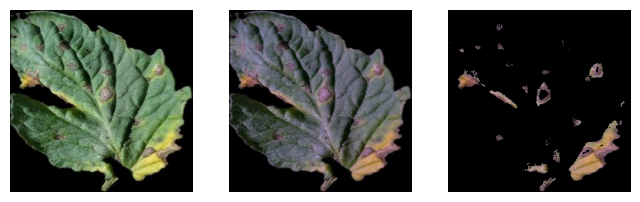

52 Tomato___Early_blight 055ae8d8-09e1-4b27-b385-9ff8a3e0eaae___RS_Erly.B 8247_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[77.14592524510027, 137.77544021530838, 115.76519607843711, 77.14592524510027, 0.9294031490329566, 0.8743786428767208, 0.8940623465367155, 0.9294031490329566, 0.9236998040246552, 0.920048288695614, 0.9217390054594267, 0.9236998040246552, 0.9352142641925112, 0.9257782121085586, 0.9280398564166196, 0.9352142641925112, 0.8532213279551866, 0.8464888535317279, 0.8496027941853329, 0.8532213279551866, 1.3523284313725896, 2.2081353325645177, 1.9337928921569496

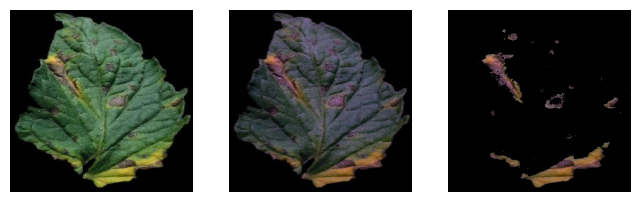

53 Tomato___Early_blight 05fab431-cc13-4d6d-b4e1-912e0059c7c1___RS_Erly.B 8349_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[86.09087009804098, 125.8102575932387, 120.63967524510058, 86.09087009804098, 0.8679797265581374, 0.8077923950994416, 0.8149991643055986, 0.8679797265581374, 0.9513490769174805, 0.9483443343553587, 0.9489903048781083, 0.9513490769174805, 0.9573600290398829, 0.9527023858258223, 0.9530956781367681, 0.9573600290398829, 0.9050650661517423, 0.8993569765039084, 0.900582598752645, 0.9050650661517423, 1.2048406862745376, 1.7096808919647108, 1.6419117647059205,

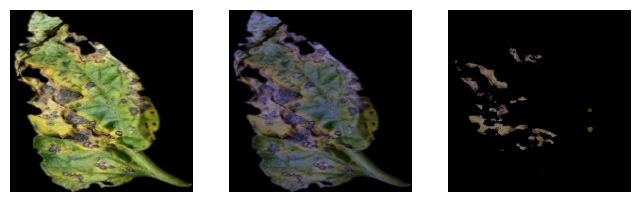

54 Tomato___Early_blight 074bc781-f586-46b0-bef5-0237e3bf5043___RS_Erly.B 8375_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[123.26467524510004, 189.88462898885288, 153.55517769608062, 123.26467524510004, 0.8652961385970306, 0.793247478417091, 0.8321946224013325, 0.8652961385970306, 0.924085364114785, 0.9197137631333855, 0.9224005356444224, 0.924085364114785, 0.9359639885597836, 0.9268980606304377, 0.9303963596439508, 0.9359639885597836, 0.8539337601711547, 0.8458734060969731, 0.8508227481571173, 0.8539337601711547, 1.7465686274510173, 2.5855594002307347, 2.155116421568651,

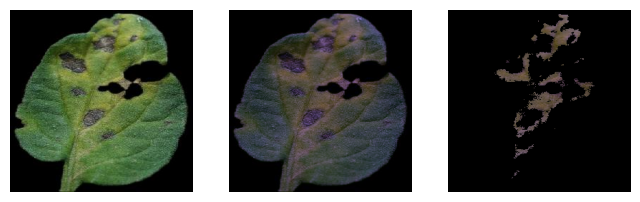

55 Tomato___Early_blight 0fbc786c-62a7-44f3-8db8-2649809bf1aa___RS_Erly.B 9514_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[37.31112132352976, 51.49308727412608, 41.345496323529744, 37.31112132352976, 0.6563019107458142, 0.5274943484371828, 0.6191385414969689, 0.6563019107458142, 0.9846817527740641, 0.9831148625424234, 0.9842375902951884, 0.9846817527740641, 0.9858232914982014, 0.9838443781808375, 0.9851356575368907, 0.9858232914982014, 0.9695981542462032, 0.9665148329518081, 0.9687236341500791, 0.9695981542462032, 0.5641544117647117, 0.7737331795463441, 0.6319852941176534

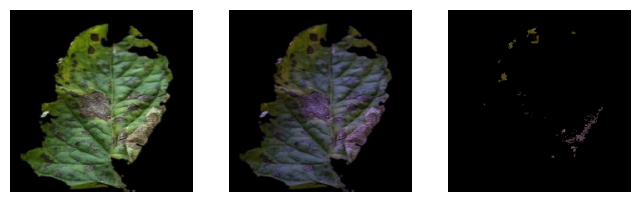

56 Tomato___Early_blight 21ad39db-c205-4220-a7e6-566042e70007___RS_Erly.B 7633_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[171.83943014706355, 307.44286043831755, 254.6729473039288, 171.83943014706355, 0.8137309360306585, 0.667975253006019, 0.723941754974295, 0.8137309360306585, 0.9378846934557649, 0.9317066775160586, 0.934408251485882, 0.9378846934557649, 0.9428756094021821, 0.9342587369557692, 0.9376732860238973, 0.9428756094021821, 0.879627698218614, 0.8680773329280128, 0.8731187804449034, 0.879627698218614, 2.140042892156898, 3.512618223760356, 3.002328431372571, 2.14

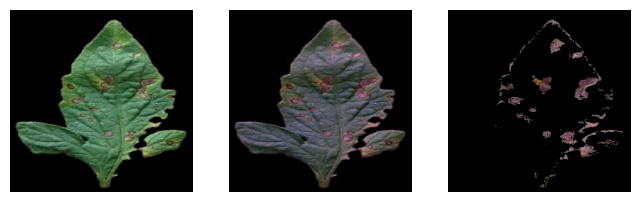

57 Tomato___Early_blight 313ff9e3-e43c-45b6-9879-b76a1e040eef___RS_Erly.B 8454_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[88.44874387254951, 111.40908881199651, 93.09132965686344, 88.44874387254951, 0.8567675022663142, 0.8202390890170589, 0.8492493722317208, 0.8567675022663142, 0.9201031804570163, 0.9171757736066369, 0.9193373483844219, 0.9201031804570163, 0.9350304631717902, 0.9298518777871125, 0.9343784193575375, 0.9350304631717902, 0.8465898626871168, 0.841211399690933, 0.8451811601345, 0.8465898626871168, 1.475612745098058, 1.8459361783929547, 1.5729779411764926, 1.4

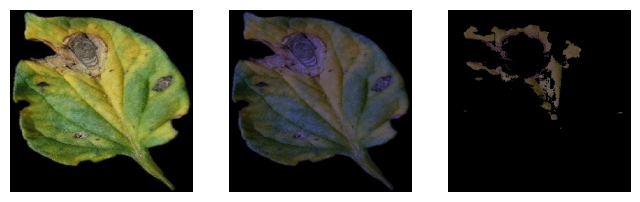

58 Tomato___Early_blight 33cd99f1-1f8a-497b-b4fc-60ff78af4b8a___RS_Erly.B 8378_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[52.198529411765, 82.05696270665196, 69.27889093137306, 52.198529411765, 0.849321617890923, 0.7640234434901761, 0.8000167568418555, 0.849321617890923, 0.9593615980641583, 0.9565116051673231, 0.9579218071120392, 0.9593615980641583, 0.9660150888975818, 0.9606921326839676, 0.9627547388052332, 0.9660150888975818, 0.9203746758402157, 0.9149144508197691, 0.9176141885407948, 0.9203746758402157, 0.8798100490196208, 1.3151557093425743, 1.1262254901960915, 0.879

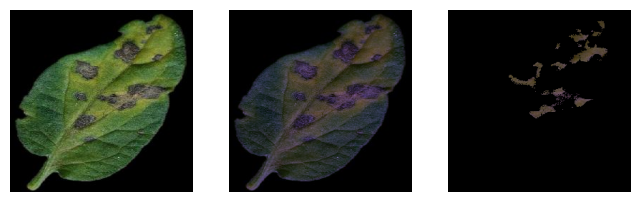

59 Tomato___Early_blight 3b1caf5d-9b90-4adc-bde6-8a16af479f0a___RS_Erly.B 8270_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[207.23360906863755, 319.9241061130589, 257.38748468138516, 207.23360906863755, 0.8427962742850478, 0.7580509819370548, 0.8046486789625567, 0.8427962742850478, 0.901090866973487, 0.8951073137416297, 0.8987019813800174, 0.901090866973487, 0.9084516903612808, 0.8999362178979103, 0.9043936651683384, 0.9084516903612808, 0.8119647505430303, 0.8012171031137563, 0.8076652513363691, 0.8119647505430303, 2.937193627451074, 4.242137639369796, 3.5549479166668028, 

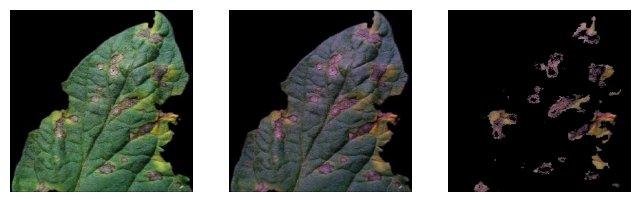

60 Tomato___Early_blight 3b3193c5-e717-4b40-b450-7ee5c6e22d1a___RS_Erly.B 9382_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[147.69491421568787, 208.78579008074828, 164.1326593137283, 147.69491421568787, 0.7211387506461463, 0.6072853255397457, 0.6901028130924306, 0.7211387506461463, 0.9597439790513583, 0.9563729650884881, 0.9589476774647433, 0.9597439790513583, 0.9624555541430229, 0.9579329148010929, 0.9612299514235538, 0.9624555541430229, 0.9211085053253341, 0.9146492483521464, 0.9195806481150253, 0.9211085053253341, 1.7382965686274747, 2.4013840830451048, 1.93348651960786

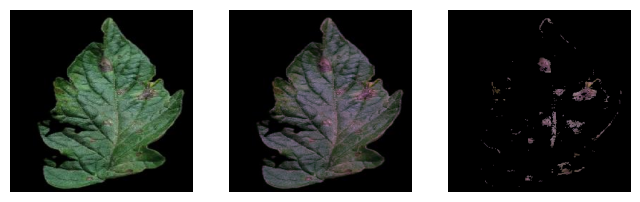

61 Tomato___Early_blight 3b86d42f-4b22-4bfe-bfa9-ec4567c886dc___RS_Erly.B 7823_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[146.8800551470607, 219.13199538639935, 152.78933823529633, 146.8800551470607, 0.8082634250170404, 0.7150310681369874, 0.8005494729844904, 0.8082634250170404, 0.9648139426669097, 0.9618930736009664, 0.9644770216545243, 0.9648139426669097, 0.9678645719492557, 0.9638230445721616, 0.9667747843818068, 0.9678645719492557, 0.9308659439644669, 0.9252382850415143, 0.9302159252995819, 0.9308659439644669, 1.51504289215687, 2.164059976932048, 1.577910539215701, 1

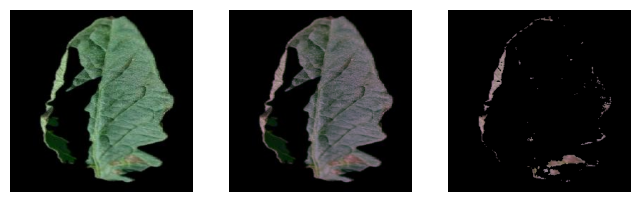

62 Tomato___Early_blight 3c09557f-b69a-423e-a84f-8fd9ee6467d2___RS_Erly.B 9490_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[101.34405637255126, 142.7943406382265, 112.23272058823751, 101.34405637255126, 0.8121736061552358, 0.7363468109431872, 0.7919930587544018, 0.8121736061552358, 0.9526814932706235, 0.9498665419359703, 0.9518084402256229, 0.9526814932706235, 0.957286273185816, 0.9528656529429417, 0.9555129464998648, 0.957286273185816, 0.907602027620345, 0.9022464474893984, 0.9059393068847333, 0.907602027620345, 1.3416666666666943, 1.8576547481739125, 1.4967830882353166, 

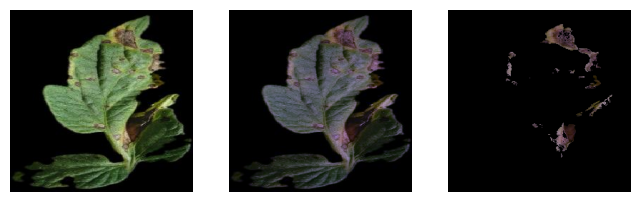

63 Tomato___Early_blight 3dab5935-91ca-489d-b4f4-127300fc527e___RS_Erly.B 6342_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[108.76341911764982, 171.13384083045986, 153.735937500005, 108.76341911764982, 0.8727453940546858, 0.8005133092071699, 0.8201269663559008, 0.8727453940546858, 0.9402279514733066, 0.9363339984854371, 0.9377006801370288, 0.9402279514733066, 0.9469120482747999, 0.940409206455624, 0.9423131810857407, 0.9469120482747999, 0.8840286007316907, 0.8767213567197264, 0.8792825655294463, 0.8840286007316907, 1.4961090686274874, 2.2756170703577028, 2.060569852941223,

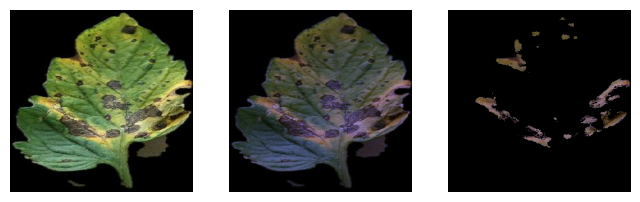

64 Tomato___Early_blight 3e9cd8a5-ebe7-4a65-940c-7fd721195c73___RS_Erly.B 7616_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[150.43805147059007, 200.727996924272, 153.2852328431384, 150.43805147059007, 0.7601207395281564, 0.6811557251700991, 0.7555807992976125, 0.7601207395281564, 0.972243075412148, 0.9704120463130769, 0.9720439564579709, 0.972243075412148, 0.9734312443316198, 0.9712952134998496, 0.9731399177615301, 0.9734312443316198, 0.9452565976868718, 0.9416995396295333, 0.9448694532864657, 0.9452565976868718, 1.489613970588248, 1.9211072664361026, 1.5352328431372702, 1

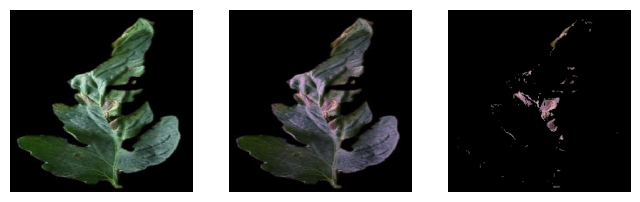

65 Tomato___Early_blight 42ef04d9-9bea-4bd2-9ea4-54cb16c9be24___RS_Erly.B 9616_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[97.06960784313938, 143.09816224530746, 99.86464460784526, 97.06960784313938, 0.8880052940191849, 0.8355242856041518, 0.8847805017528505, 0.8880052940191849, 0.9607386930762399, 0.9589085392588977, 0.9607539986311788, 0.9607386930762399, 0.9629861736964764, 0.9603381650078903, 0.9627062883379847, 0.9629861736964764, 0.9230188363738415, 0.919505586663633, 0.9230482458857993, 0.9230188363738415, 1.2132965686274761, 1.72982698961956, 1.307843137254925, 1.

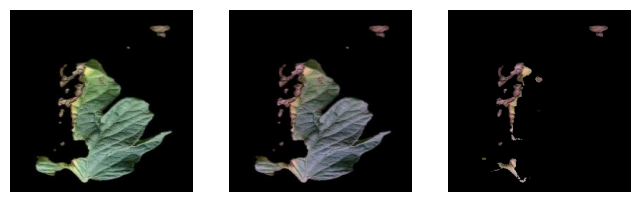

66 Tomato___Early_blight 45a51377-1fd4-45f3-bfdb-02d9d0953ab2___RS_Erly.B 9471_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[76.51274509803999, 130.7548173779361, 120.81513480392239, 76.51274509803999, 0.753229815746326, 0.5798936399187672, 0.6103450080376204, 0.753229815746326, 0.9684139468526094, 0.9641543825489698, 0.9650141638316894, 0.9684139468526094, 0.9714519783498404, 0.9658433021745181, 0.9669043145746167, 0.9714519783498404, 0.9378255724586486, 0.9295936733883852, 0.9312523363957745, 0.9378255724586486, 1.0505514705882508, 1.7272741253364627, 1.609957107843144, 1

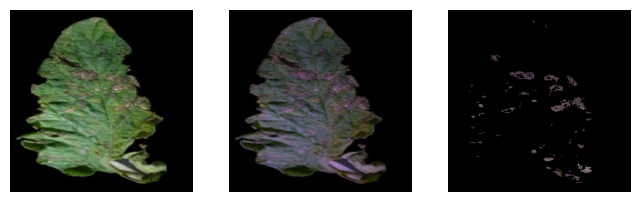

67 Tomato___Early_blight 45d27217-fbb3-4b74-93e7-d84f70b784f8___RS_Erly.B 7713_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[198.35867034313998, 318.61456362938395, 237.74399509804184, 198.35867034313998, 0.6864856301441838, 0.498342985437207, 0.6242354383540328, 0.6864856301441838, 0.9728867311836317, 0.9690134639278594, 0.9713704561908639, 0.9728867311836317, 0.9745724291695358, 0.9698035575666414, 0.9725267438317117, 0.9745724291695358, 0.9465085917131719, 0.9389870932734689, 0.9435605631604471, 0.9465085917131719, 1.690471813725492, 2.6356016916571394, 2.036029411764711

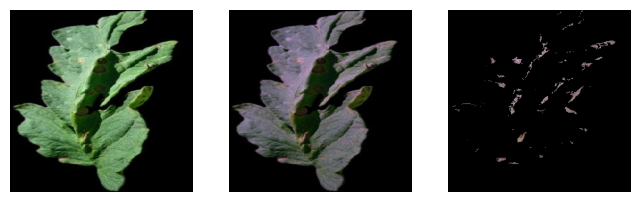

68 Tomato___Early_blight 5c81bfc2-d377-4fc8-9f51-ff26a997c20b___RS_Erly.B 6345_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[61.78661151960916, 107.7640292195358, 99.16053921568935, 61.78661151960916, 0.9085582066221248, 0.8410995420860828, 0.8532462403230804, 0.9085582066221248, 0.9341774717071477, 0.9305670986649485, 0.931359009131602, 0.9341774717071477, 0.9436092443342863, 0.9356865189616771, 0.9368168837497122, 0.9436092443342863, 0.8726875486451587, 0.8659551251177, 0.8674296038905994, 0.8726875486451587, 1.1129901960784634, 1.8267128027682598, 1.7025735294118323, 1.1

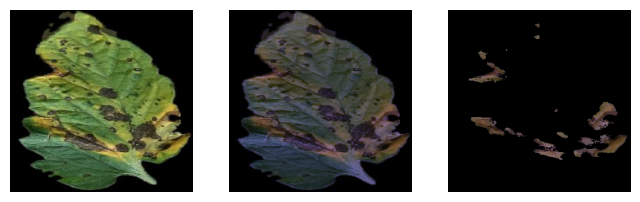

69 Tomato___Early_blight 64fade29-cabf-4ec2-a5cf-8c7aeca19eea___RS_Erly.B 6427_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[37.729932598040534, 74.61204152249596, 60.55140931372775, 37.729932598040534, 0.9348833197734944, 0.8717057017235369, 0.8954965862369185, 0.9348833197734944, 0.9383436688109938, 0.934872516162942, 0.9363522654019056, 0.9383436688109938, 0.9465180503942905, 0.9393452359260762, 0.9419169942685355, 0.9465180503942905, 0.8804888407976762, 0.8739866214768303, 0.8767555649232807, 0.8804888407976762, 0.8759803921568996, 1.5073587081892432, 1.2892463235294553

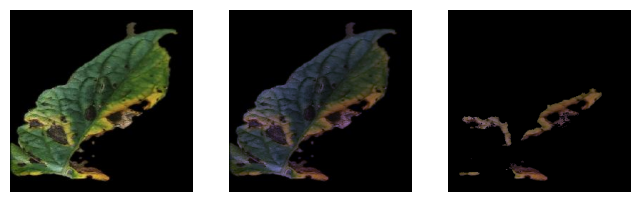

70 Tomato___Early_blight 66eef337-720e-4166-a1d0-a9d3ce7f96f3___RS_Erly.B 6422_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[38.488694852941904, 55.48069204152466, 44.86850490196146, 38.488694852941904, 0.8459954775537507, 0.7788568247265822, 0.8204679920505108, 0.8459954775537507, 0.9769610726068314, 0.9753944916428552, 0.9763789956987526, 0.9769610726068314, 0.9792880285766354, 0.9769110205806458, 0.9781652973238024, 0.9792880285766354, 0.9544529373890904, 0.9513944143272239, 0.9533159432417049, 0.9544529373890904, 0.5878063725490317, 0.8239600153787374, 0.679779411764719

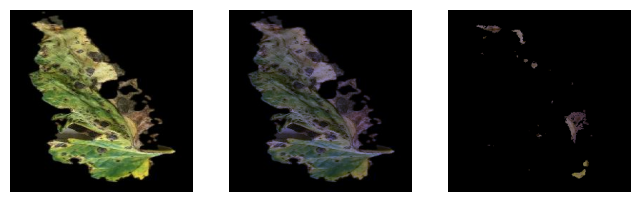

71 Tomato___Early_blight 68d12608-22a0-4b11-ab99-37cb4cd6fdce___RS_Erly.B 6392_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[28.619546568628067, 39.83227989235002, 31.906495098039983, 28.619546568628067, 0.834475660419865, 0.7705059682715251, 0.8154652269994689, 0.834475660419865, 0.9730703130642141, 0.9714270351025932, 0.972626108061677, 0.9730703130642141, 0.9766009384112202, 0.9734882719912253, 0.974956623450117, 0.9766009384112202, 0.9468658341668876, 0.9436704845282148, 0.946001546083205, 0.9468658341668876, 0.5451593137255021, 0.7491272587466602, 0.6306066176470709, 0

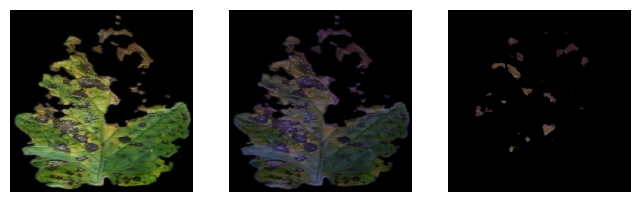

72 Tomato___Early_blight 6a6f1594-62fa-487a-a51f-38b86e7483cf___RS_Erly.B 6360_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[19.075796568627567, 24.625082660515456, 18.543627450980484, 19.075796568627567, 0.6719153466343717, 0.5781189665034848, 0.6810681240749884, 0.6719153466343717, 0.9924633398016383, 0.9920185862202399, 0.9924633299892828, 0.9924633398016383, 0.9930004845005866, 0.9924930612781494, 0.9929776495544678, 0.9930004845005866, 0.9849834808502221, 0.9841008754064035, 0.984983461373416, 0.9849834808502221, 0.2853247549019634, 0.3513417916186137, 0.28305759803921

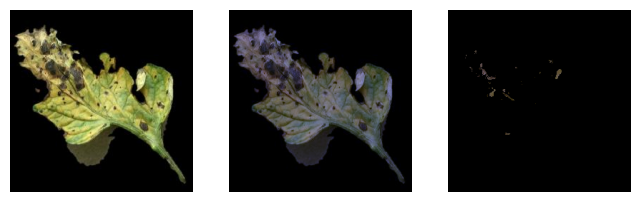

73 Tomato___Early_blight 70de9ac6-f90f-441f-a51f-217f55213234___RS_Erly.B 9568_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[65.28860294117686, 88.7157862360662, 81.01311274509871, 65.28860294117686, 0.7783121875497276, 0.6999230860505762, 0.7249195275256645, 0.7783121875497276, 0.9799940907485808, 0.978977569837526, 0.979335393449223, 0.9799940907485808, 0.9824631998732839, 0.9808821636874586, 0.9811875965478453, 0.9824631998732839, 0.9603884179021377, 0.9583970822449882, 0.9590978128623445, 0.9603884179021377, 0.6473958333333453, 0.8704959630911524, 0.8155024509804062, 0.

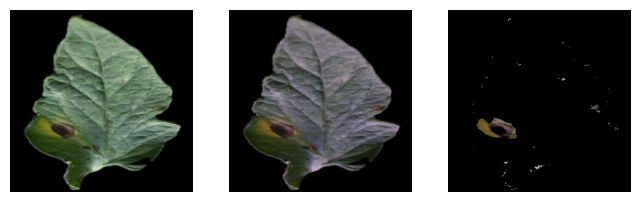

74 Tomato___Early_blight 71eb9b0a-a7ea-47a0-8108-71949d74e22d___RS_Erly.B 7557_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[105.25863970588468, 172.77004229143432, 137.69298406863052, 105.25863970588468, 0.8193525340970154, 0.7045948887990786, 0.7636879147011469, 0.8193525340970154, 0.946753776091337, 0.9423629785382839, 0.94459428484737, 0.946753776091337, 0.951798841258056, 0.9451459247453674, 0.9480199159516397, 0.951798841258056, 0.8963427125432056, 0.888047983319546, 0.8922583629663143, 0.8963427125432056, 1.5218137254902284, 2.333133410226957, 1.9399509803922077, 1.5

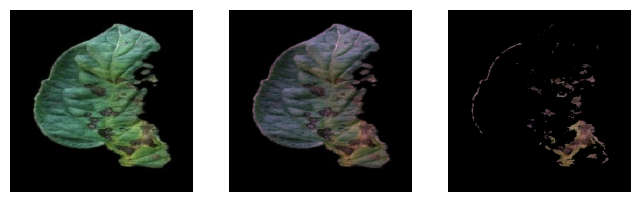

75 Tomato___Early_blight 71ec70cc-dfa7-4798-8970-80edfa6435f2___RS_Erly.B 7484_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[118.29316789216169, 188.4284198385408, 135.19197303922016, 118.29316789216169, 0.8954932288088889, 0.8341440814134039, 0.8805638834005663, 0.8954932288088889, 0.9332732303367811, 0.9301053036672859, 0.932614517414333, 0.9332732303367811, 0.9398706646157476, 0.9336201470523767, 0.9375293812366987, 0.9398706646157476, 0.8709989224632504, 0.8650958759100142, 0.8697698380919693, 0.8709989224632504, 1.6528799019608356, 2.4776009227222473, 1.891084558823596

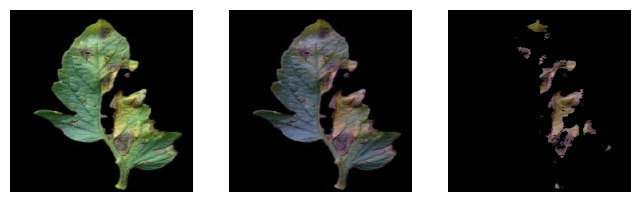

76 Tomato___Early_blight 752de1b6-d4be-4741-9812-3681c6bd4b40___RS_Erly.B 8308_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[113.83789828431765, 187.32059976933024, 156.73008578431967, 113.83789828431765, 0.8739523109322653, 0.7933499745598674, 0.8264596815450626, 0.8739523109322653, 0.933870783581051, 0.9299520388996715, 0.9318030590999907, 0.933870783581051, 0.9399438127737892, 0.9337518331667134, 0.9363394599154997, 0.9399438127737892, 0.8721146404262863, 0.8648107946536562, 0.8682569409481009, 0.8721146404262863, 1.628492647058883, 2.499869281045895, 2.1543198529412564,

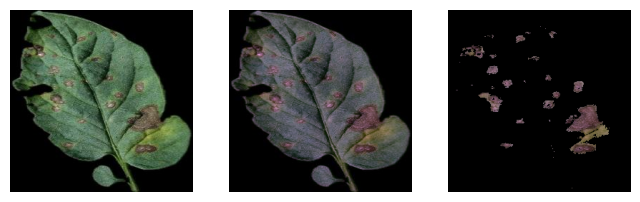

77 Tomato___Early_blight 7d8a95e9-ea83-44f4-9f7c-ad4692b1ce1f___RS_Erly.B 7534_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[3.529044117647083, 4.357062668204549, 3.0071997549019907, 3.529044117647083, 0.883104713912373, 0.8562316919067435, 0.9003901725359316, 0.883104713912373, 0.9797187279066669, 0.9792700796997703, 0.9799637415088802, 0.9797187279066669, 0.9839476366374144, 0.9826122485389197, 0.9836888085365165, 0.9839476366374144, 0.9598487858110576, 0.9589698889951944, 0.9603289346720835, 0.9598487858110576, 0.16387867647058993, 0.20287581699346469, 0.1581188725490218

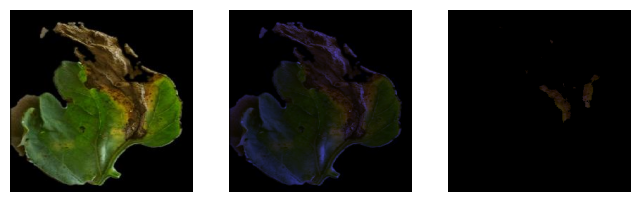

78 Tomato___Early_blight 84fe717f-2161-43c2-ad2f-ee2678a31e9f___RS_Erly.B 9416_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[40.707935049019994, 55.6993771626313, 48.63186274509836, 40.707935049019994, 0.7534154664623826, 0.6639058071300159, 0.70541701082049, 0.7534154664623826, 0.9817252193813789, 0.9804849245750439, 0.981158480946955, 0.9817252193813789, 0.9832005801695447, 0.98143485054033, 0.9823565010756907, 0.9832005801695447, 0.9637844063694166, 0.9613506873189295, 0.9626719647341363, 0.9637844063694166, 0.596783088235302, 0.7940945790081015, 0.7000000000000093, 0.59

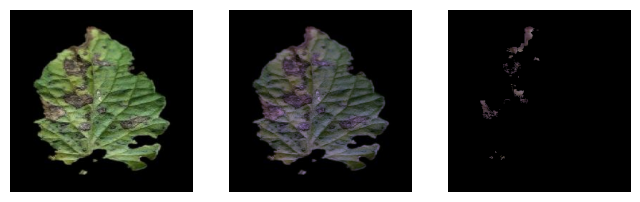

79 Tomato___Early_blight 87b9735b-4018-4b28-b0b3-422a184a6716___RS_Erly.B 7509_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[15.782107843137311, 18.813994617455172, 15.19126838235303, 15.782107843137311, 0.7296057412251634, 0.6789030702747916, 0.739728571435271, 0.7296057412251634, 0.9820315677491129, 0.9815305255662917, 0.9820928422988272, 0.9820315677491129, 0.9846851671432708, 0.9837498989087484, 0.9848124585923088, 0.9846851671432708, 0.9643860000557807, 0.9634021726184409, 0.964506350894589, 0.9643860000557807, 0.33474264705882933, 0.3908650519031229, 0.326286764705887

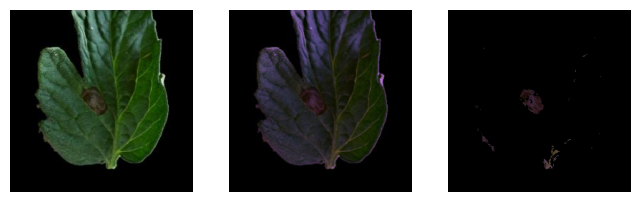

80 Tomato___Early_blight 9eec6625-b337-403b-b93c-e809f4e0b8c4___RS_Erly.B 7681_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[183.58851102941415, 239.80884275280368, 205.97898284314053, 183.58851102941415, 0.7700928067882403, 0.7008268140955094, 0.7420533042043583, 0.7700928067882403, 0.9629909632400964, 0.9614005118582509, 0.9625927675529063, 0.9629909632400964, 0.9649986868825714, 0.9626542842391371, 0.9641456119158266, 0.9649986868825714, 0.9273515952820887, 0.9242909442013069, 0.9265848361451636, 0.9273515952820887, 1.804442401960809, 2.289119569396552, 2.013204656862772

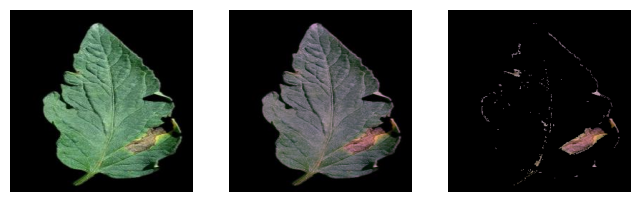

81 Tomato___healthy 000bf685-b305-408b-91f4-37030f8e62db___GH_HL Leaf 308.1_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[58.954656862745175, 68.06600538254607, 36.71902573529442, 58.954656862745175, 0.6923830040703546, 0.6462199014703343, 0.8084053577573719, 0.6923830040703546, 0.9915748753589548, 0.9912804250970927, 0.99224885113369, 0.9915748753589548, 0.9919467170274405, 0.9916398595941233, 0.993061227162727, 0.9919467170274405, 0.9832207334431268, 0.9826368811806727, 0.9845577825761277, 0.9832207334431268, 0.5270220588235331, 0.5992156862745213, 0.3472426470588263, 0.5

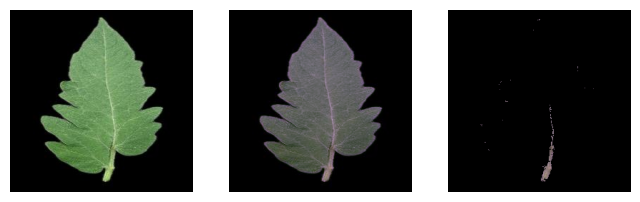

82 Tomato___healthy 00bce074-967b-4d50-967a-31fdaa35e688___RS_HL 0223_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[1.991819852941178, 2.233479430988081, 2.2037990196078443, 1.991819852941178, 0.16649088283925073, 0.06901485602911712, 0.07778478434148534, 0.16649088283925073, 0.9996936296809374, 0.999677050069329, 0.9996783115816764, 0.9996936296809374, 0.9996940812035315, 0.9996776845201145, 0.9996792561277545, 0.9996940812035315, 0.9993873532246472, 0.9993542044353159, 0.9993567266467913, 0.9993873532246472, 0.023406862745098046, 0.025990003844675123, 0.02573529411764707,

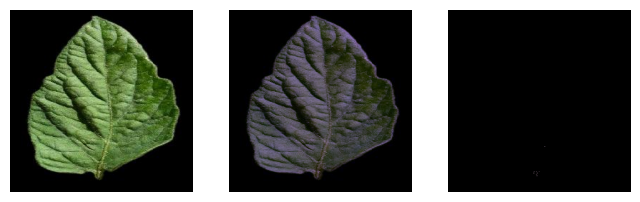

83 Tomato___healthy 0a0d6a11-ddd6-4dac-8469-d5f65af5afca___RS_HL 0555_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[45.84779411764725, 50.44988850442168, 50.006280637255045, 45.84779411764725, 0.5199546272047391, 0.47382582275687346, 0.4764135528741671, 0.5199546272047391, 0.9953125564068972, 0.9951403934435613, 0.9952053342145513, 0.9953125564068972, 0.9954812734962206, 0.9952859939758418, 0.9952832126247688, 0.9954812734962206, 0.990647084941233, 0.9903044026630059, 0.9904336572490967, 0.990647084941233, 0.3837622549019629, 0.4212533640907377, 0.41443014705882575, 0.38376

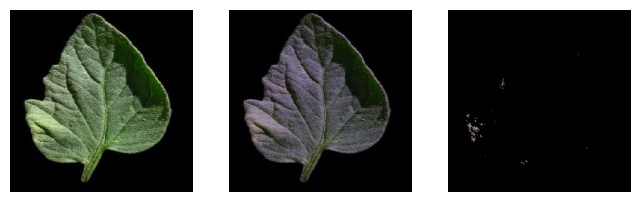

84 Tomato___healthy 0a31e630-0d98-416b-b0e4-88a88aad1dc5___RS_HL 9653_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[0.6832414215686275, 0.6859207996924261, 0.3428615196078431, 0.6832414215686275, -3.058255100953437e-05, -3.0702486264318245e-05, 0.4981685911246873, -3.058255100953437e-05, 0.9999387259595457, 0.9999384856710388, 0.9999540442936504, 0.9999387259595457, 0.9999387310250549, 0.9999384907545651, 0.9999542336976064, 0.9999387310250549, 0.9998774556735994, 0.9998769751260903, 0.9999080906992278, 0.9998774556735994, 0.006464460784313727, 0.006489811610918878, 0.00337

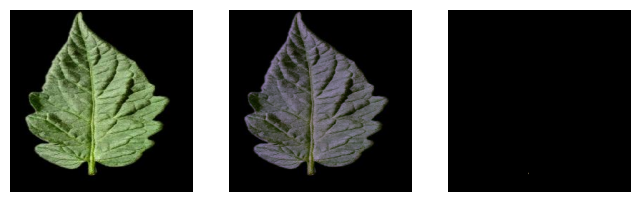

85 Tomato___healthy 0a334ae6-bea3-4453-b200-85e082794d56___GH_HL Leaf 310.1_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[71.08676470588242, 86.28029219531064, 65.23103553921584, 71.08676470588242, 0.5005241975124719, 0.3961267156733184, 0.541668214078307, 0.5005241975124719, 0.9925093776026221, 0.9919879494611284, 0.99272380814908, 0.9925093776026221, 0.9927090298892531, 0.9921195111965918, 0.9929691562318366, 0.9927090298892531, 0.9850748646291443, 0.9840400918760944, 0.9855005592660114, 0.9850748646291443, 0.6227328431372573, 0.746297577854681, 0.580974264705885, 0.62273

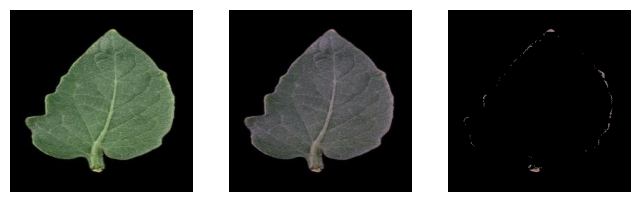

86 Tomato___healthy 0a86ddc0-4950-4efc-9260-0f16d4db046b___RS_HL 0469_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[24.014644607843216, 21.91089580930421, 19.44785539215691, 24.014644607843216, 0.3809887693734038, 0.4374187883685886, 0.49870418255469984, 0.3809887693734038, 0.997579681267827, 0.9976163242404794, 0.997763500265405, 0.997579681267827, 0.9976251845235498, 0.9976355280430895, 0.9978081905339518, 0.9976251845235498, 0.9951652204784194, 0.9952383303910854, 0.9955320024618728, 0.9951652204784194, 0.21305147058823598, 0.20121491733948554, 0.17447916666666716, 0.213

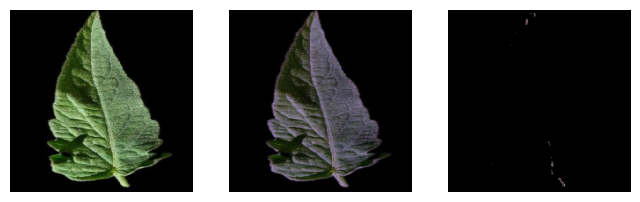

87 Tomato___healthy 0a9986e6-b629-4ff5-8aab-7488ea9b935b___RS_HL 9704_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[24.062561274509893, 27.63410995770863, 22.977144607843194, 24.062561274509893, 0.4615572803012059, 0.3840492547173226, 0.48584541386018426, 0.4615572803012059, 0.9976256380899308, 0.9974933059014844, 0.9976562775785648, 0.9976256380899308, 0.9976907430844524, 0.9975586298902666, 0.9977524916845291, 0.9976907430844524, 0.9952569137743416, 0.9949928953182724, 0.9953180481919184, 0.9952569137743416, 0.20358455882353022, 0.23160322952710574, 0.19359681372549067, 0

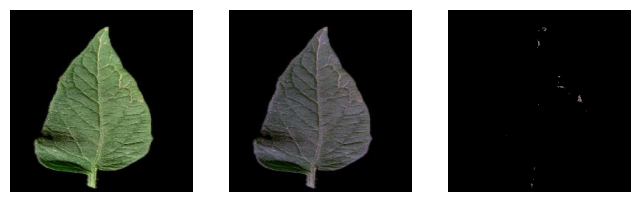

88 Tomato___healthy 0aacdad5-c9b9-4309-96e3-0797bbed1375___RS_HL 9836_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[24.633026960784402, 24.67678585159563, 22.824571078431486, 24.633026960784402, 0.49068317277232354, 0.4917676961773037, 0.5280751268203413, 0.49068317277232354, 0.9970282166359248, 0.9969550525885295, 0.9970894923205892, 0.9970282166359248, 0.9971392427072454, 0.9970210448622576, 0.9971881166956449, 0.9971392427072454, 0.9940652647682127, 0.9939193768817974, 0.9941874556961303, 0.9940652647682127, 0.2306372549019619, 0.23938485198000908, 0.2172181372549029, 0.

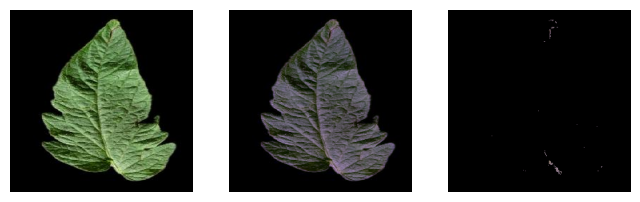

89 Tomato___healthy 0b330273-890c-4995-af72-cba070fc0061___GH_HL Leaf 312_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[61.98995098039224, 75.9896039984626, 53.94252450980401, 61.98995098039224, 0.47819020427350656, 0.36283705119425536, 0.5459306347195618, 0.47819020427350656, 0.9951593819311595, 0.9948482147935498, 0.9954350964615751, 0.9951593819311595, 0.9953091401444363, 0.9949356016722828, 0.9955682868422404, 0.9953091401444363, 0.9903421954456073, 0.9897229704779129, 0.9908910312674654, 0.9903421954456073, 0.46976102941176673, 0.5593233371780123, 0.4043504901960809, 0

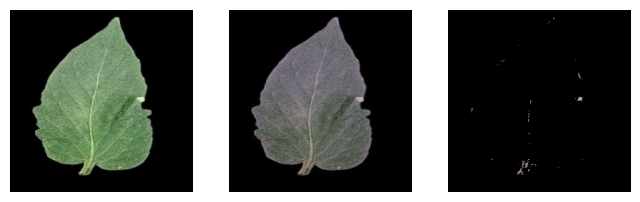

90 Tomato___healthy 0bfe260c-a71e-474e-bfb1-78f1e5ca5698___RS_HL 0497_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[47.01424632352953, 54.789819300269286, 40.36277573529423, 47.01424632352953, 0.4101186068450033, 0.31523935694217226, 0.49357370915840715, 0.4101186068450033, 0.9966912167895832, 0.9964937068387472, 0.9968597132103441, 0.9966912167895832, 0.9967450071266679, 0.9965169169449744, 0.9969263874446432, 0.9967450071266679, 0.9933933816255, 0.992999707769227, 0.9937292878218095, 0.9933933816255, 0.34761029411764854, 0.40070742022299244, 0.2999080882352956, 0.34761029

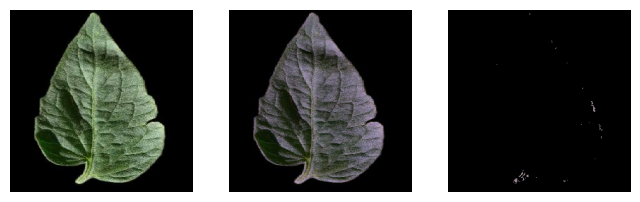

91 Tomato___healthy 0c3eaf2d-8203-441d-9248-1c64e00b5b8b___RS_HL 0018_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[1.423406862745098, 1.8064436755094202, 1.2123774509803924, 1.423406862745098, 0.36667144725423695, 0.19938304780925273, 0.4605665628657914, 0.36667144725423695, 0.9998774519191487, 0.9998615930555907, 0.9998774517431319, 0.9998774519191487, 0.9998775666164796, 0.9998620163078522, 0.9998930126785126, 0.9998775666164796, 0.9997549188563295, 0.9997232052676637, 0.9997549185043392, 0.9997549188563295, 0.011887254901960787, 0.014886582083813923, 0.01060049019607843

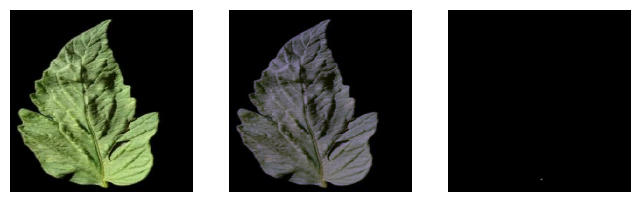

92 Tomato___healthy 0c4b06d5-4053-44fc-99b6-504934fdd3a9___GH_HL Leaf 199.1_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[14.142677696078433, 16.420023068050753, 12.384895833333346, 14.142677696078433, 0.3018837918535933, 0.19263144850822128, 0.388652085322404, 0.3018837918535933, 0.998192435284124, 0.9980777026614758, 0.9982690208966714, 0.998192435284124, 0.9982323563989306, 0.9980952712896678, 0.9983420669039644, 0.9982323563989306, 0.9963881378584502, 0.9961591005500093, 0.9965410380819988, 0.9963881378584502, 0.1463541666666669, 0.1681814686658979, 0.12956495098039247,

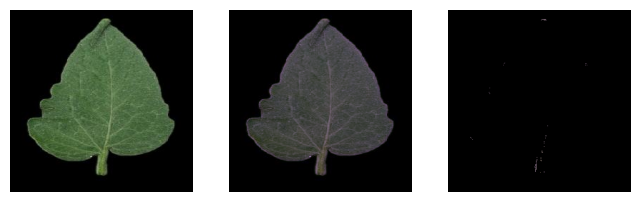

93 Tomato___healthy 0c8c9c80-b7e0-47a7-81d3-b5a2174e545d___GH_HL Leaf 496.1_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[40.97873774509818, 47.07063437139604, 24.26390931372567, 40.97873774509818, 0.6507878450947981, 0.6004361372352501, 0.7932280854872338, 0.6507878450947981, 0.9958180530572411, 0.9956478751474465, 0.9961856946251679, 0.9958180530572411, 0.9959862610308443, 0.995771786390375, 0.9965264827478433, 0.9959862610308443, 0.9916535947947144, 0.9913146912856252, 0.9923859381758283, 0.9916535947947144, 0.32196691176470776, 0.3656132256824338, 0.20337009803921693, 0

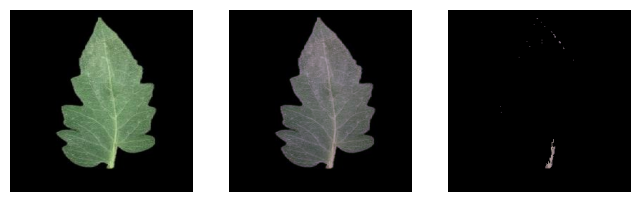

94 Tomato___healthy 0cabff41-b00b-4692-98af-6b8b0aeba7aa___RS_HL 9774_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[22.072671568627605, 31.17293348712071, 19.75680147058833, 22.072671568627605, 0.8083826099704694, 0.7304338006740921, 0.8284871533853415, 0.8083826099704694, 0.9945925589564871, 0.9942484150148465, 0.9946691548631266, 0.9945925589564871, 0.9949435408871643, 0.9945048580595613, 0.995043153440857, 0.9949435408871643, 0.9892143583316134, 0.9885299107595344, 0.9893667276361264, 0.9892143583316134, 0.23177083333333548, 0.3081276432141533, 0.20554534313725736, 0.231

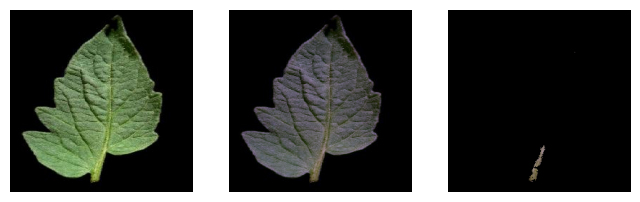

95 Tomato___healthy 0caff918-5807-40f2-b9e4-7dd34a7bab5d___RS_HL 0345_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[69.64938725490202, 78.55212610534483, 60.828124999999936, 69.64938725490202, 0.5586465213063821, 0.5041663964062041, 0.6145449999020526, 0.5586465213063821, 0.9925552876107812, 0.9922646754870073, 0.9928309955668881, 0.9925552876107812, 0.992686421581489, 0.9924087923020491, 0.9931695539666401, 0.992686421581489, 0.9851659989641205, 0.9845891862193358, 0.9857133857583383, 0.9851659989641205, 0.6081495098039248, 0.675094194540569, 0.5238357843137285, 0.60814950

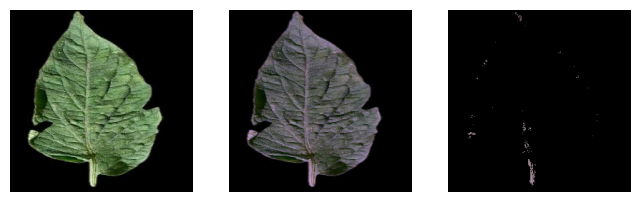

96 Tomato___healthy 0cb10f98-491d-4e1f-b8ea-4fb0f1b3675f___GH_HL Leaf 333_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[20.481464460784345, 23.71964628988853, 16.754901960784338, 20.481464460784345, 0.3233408572657927, 0.2194164307900952, 0.44645766814733656, 0.3233408572657927, 0.9979779636907259, 0.9978316315532262, 0.998085191259137, 0.9979779636907259, 0.9980292500389842, 0.9978524953724148, 0.998136893357997, 0.9980292500389842, 0.9959600160122879, 0.9956679649281733, 0.9961740490107881, 0.9959600160122879, 0.1806066176470592, 0.21170319108035404, 0.1552696078431377, 0

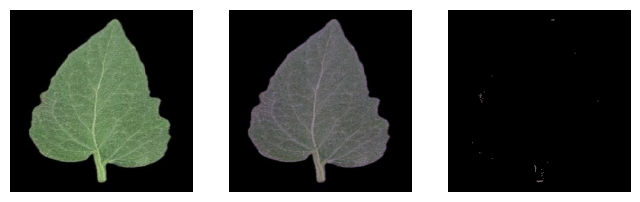

97 Tomato___healthy 0cfee8b1-5de4-4118-9e25-f9c37bb6f17e___GH_HL Leaf 252_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[14.05588235294119, 16.394771241830203, 10.604258578431388, 14.05588235294119, 0.6222865241144542, 0.561151979721248, 0.7150394926284854, 0.6222865241144542, 0.9966299425765746, 0.9964783225022026, 0.996829074426276, 0.9966299425765746, 0.9967635053996213, 0.9966345027424091, 0.997167004279987, 0.9967635053996213, 0.9932712424401863, 0.9929690472168036, 0.9936682036215462, 0.9932712424401863, 0.1691482843137265, 0.19484813533256584, 0.12889093137254998, 0.1

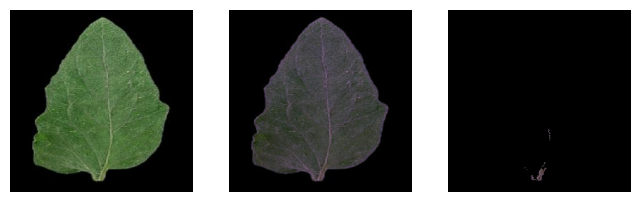

98 Tomato___healthy 0de16216-510d-48c1-9ef0-78ce39328ff2___GH_HL Leaf 240_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[35.63085171568646, 42.211641676278575, 24.393903186274674, 35.63085171568646, 0.5011268422265405, 0.41128915579758846, 0.6584571255814442, 0.5011268422265405, 0.9949449233431834, 0.9945714143173027, 0.9952972353047386, 0.9949449233431834, 0.995147769025013, 0.9946836883886463, 0.9955519739099343, 0.995147769025013, 0.9899154004863732, 0.9891722981771198, 0.9906165866052562, 0.9899154004863732, 0.3560049019607861, 0.4213763936947364, 0.26583946078431553, 0.

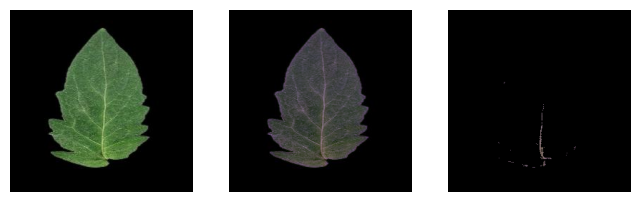

99 Tomato___healthy 0f5a5880-c1f1-4356-8336-d65c69b54cc1___GH_HL Leaf 380.1JPG_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[43.16378676470593, 49.64133794694376, 38.13458946078454, 43.16378676470593, 0.4500271033567089, 0.36995696905299447, 0.5141067964593078, 0.4500271033567089, 0.9955576609731065, 0.9953710870047373, 0.9957874282931306, 0.9955576609731065, 0.9956919325362044, 0.9954345279570667, 0.9959176036247559, 0.9956919325362044, 0.9911350563222427, 0.9907636008449923, 0.9915926023466468, 0.9911350563222427, 0.3786764705882367, 0.42608227604767707, 0.330545343137256

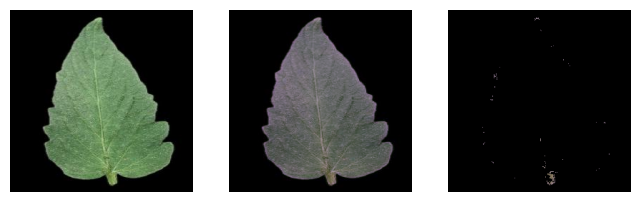

100 Tomato___healthy 0f809e80-ee2b-4ad4-9a80-50d789298d48___GH_HL Leaf 192_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[50.22490808823535, 61.85150326797434, 39.898805147058965, 50.22490808823535, 0.5670709269135422, 0.46892723410916076, 0.6560799534122097, 0.5670709269135422, 0.9947917305925696, 0.9944637517709233, 0.9950674533113686, 0.9947917305925696, 0.9948944381897737, 0.9945322943870369, 0.9952618778861244, 0.9948944381897737, 0.9896105872553597, 0.9889581535863006, 0.9901592366395727, 0.9896105872553597, 0.4238051470588261, 0.5085121107266486, 0.34754901960784507, 

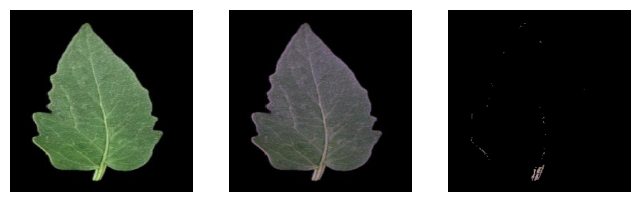

In [78]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-mixed"
csv_file_path = "D:/pythonProject/Image-research/vision/colorBased-mixed_data.csv"

angles = ['0', '45', '90','135']
properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity']

process_images(data_dir, csv_file_path, angles = angles, properties = properties, printImages=True)